In [1]:
d

## Looking at direct impact

In [44]:
# Load all samples impacts:
combined_df = pd.read_parquet("../outputs/meta_df_impact.parquet")
combined_df["number of events"] = combined_df.groupby("sample")["step"].transform("count")

#### combined_df: all TC in one dataframe

Each row is a TC

- step: step of occurrence of event
- total_damage: total secs_exp destroyed (ie productive capital)
- affected: list regions affected by the event
- max_shock_intensity: max(damage/sec_exps) across all regions (ie highest share of production capacity lost due to event) -> replaced by mean 
- max_shock_intensity_pct: same but *100 (expressed as % lost) -> replaced by mean
- recovery_duration: length of recovery duration goal (is a function of max_shock_intensity)
- sample: sample id
- MRIOT: MRIOT used
- number of events : total number of TCs in the sample of the TC looked at

In [45]:
combined_df = combined_df.drop(columns=["max_shock_intensity","max_shock_intensity_pct"])

To look at a specific sample:

In [46]:
combined_df.loc[(combined_df["sample"]==62)]

,step,total_damage,affected,recovery_duration,sample,MRIOT,mean_shock_intensity,mean_shock_intensity_pct,number of events
3678,0,9.145305e+08,"[CHN, TWN]",109,62,OECD21-2018,0.000224,0.022421,24
3679,5,6.335145e+08,[USA],49,62,OECD21-2018,0.000010,0.000969,24
3680,26,3.247540e+08,"[JPN, TWN]",72,62,OECD21-2018,0.000112,0.011237,24
3681,377,2.772849e+08,[MEX],63,62,OECD21-2018,0.000074,0.007392,24
3682,399,3.841113e+09,"[JPN, KOR]",119,62,OECD21-2018,0.000250,0.024963,24
3683,431,8.201996e+08,"[JPN, KOR]",61,62,OECD21-2018,0.000069,0.006850,24
3684,457,3.306893e+08,[USA],48,62,OECD21-2018,0.000005,0.000506,24
3685,714,5.419305e+08,"[JPN, KOR]",56,62,OECD21-2018,0.000045,0.004519,24
3686,717,5.934624e+08,"[CHN, PHL]",49,62,OECD21-2018,0.000007,0.000712,24
3687,741,3.337147e+09,"[CHN, JPN, ROW, TWN]",53,62,OECD21-2018,0.000029,0.002891,24


### Some stats on direct impacts

#### Inter Event Time (days) distribution per sample
Large graph (100 facets)

In [47]:
df = combined_df.copy()
df["time_diff"] = df.groupby("sample")["step"].diff()

In [9]:
df

,step,total_damage,affected,recovery_duration,sample,MRIOT,mean_shock_intensity,mean_shock_intensity_pct,number of events,time_diff
5218,0,2.835784e+09,[JPN],83,0,OECD21-2018,0.000150,0.015000,29,NaN
5219,8,4.344727e+08,"[CHN, PHL, ROW]",50,0,OECD21-2018,0.000014,0.001414,29,8.0
5220,57,1.208093e+09,"[CHN, PHL]",528,0,OECD21-2018,0.000778,0.077760,29,49.0
5221,91,2.025782e+09,"[ESP, FRA, PRT, ROW]",60,0,OECD21-2018,0.000062,0.006189,29,34.0
5222,92,1.053790e+09,[ROW],65,0,OECD21-2018,0.000084,0.008379,29,1.0
...,...,...,...,...,...,...,...,...,...,...
4415,1413,3.072319e+08,"[CHN, JPN, TWN]",60,99,OECD21-2018,0.000061,0.006078,28,257.0
4416,1430,1.262911e+10,"[CHN, HKG, PHL]",127,99,OECD21-2018,0.000269,0.026903,28,17.0
4417,1435,2.176910e+09,"[ROW, USA]",51,99,OECD21-2018,0.000017,0.001665,28,5.0
4418,1457,1.012324e+10,"[CHN, TWN]",247,99,OECD21-2018,0.000471,0.047098,28,22.0


In [48]:
df = df.dropna()
df = df[df["time_diff"] > 0]

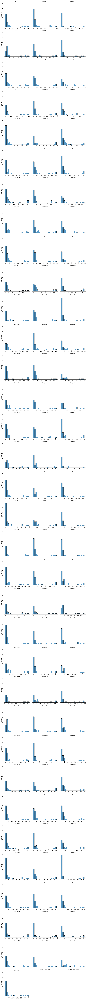

In [116]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate inter-event time differences
df = combined_df.copy()
df["time_diff"] = df.groupby("sample")["step"].diff()

df = df.dropna()
df = df[df["time_diff"] > 0]

# Create a facet grid of histograms by sample
g = sns.FacetGrid(df, col="sample", col_wrap=3, height=4, sharex=False)
g.map_dataframe(sns.histplot, x="time_diff", bins=20, edgecolor="black")
g.set_titles("Sample {col_name}")
g.set_axis_labels("Inter-Event Time (days)", "Frequency")
g.tight_layout()
plt.show()

#### Inter event time and max shock intensity stats

In [50]:
import pandas as pd

# Calculate inter-event time differences
df = combined_df.copy()
df["time_diff"] = df.groupby("sample")["step"].diff()

df = df.dropna()
df = df[df["time_diff"] > 0]

# Group by sample and calculate summary statistics
summary_df = df.groupby("sample").agg({
    "time_diff": ["mean", "std", "median", lambda x: x.quantile(0.75) - x.quantile(0.25)],
    "mean_shock_intensity": ["mean", "std", "median", lambda x: x.quantile(0.75) - x.quantile(0.25)]
}).reset_index()

summary_df.columns = ['sample', 'time_diff_mean', 'time_diff_std', 'time_diff_median', 'interquartile_difference_time_diff',
                     'mean_shock_intensity_mean', 'mean_shock_intensity_std', 'mean_shock_intensity_median', 'interquartile_difference_mean_shock_intensity']

# Display the summary statistics
summary_df

,sample,time_diff_mean,time_diff_std,time_diff_median,interquartile_difference_time_diff,mean_shock_intensity_mean,mean_shock_intensity_std,mean_shock_intensity_median,interquartile_difference_mean_shock_intensity
0,0,54.107143,88.564828,16.5,34.00,0.000406,0.000691,0.000092,0.000471
1,1,42.888889,73.734573,14.0,24.25,0.000257,0.000770,0.000086,0.000104
2,2,82.947368,164.377774,24.0,23.00,0.000142,0.000288,0.000031,0.000066
3,3,58.360000,81.486134,27.0,18.00,0.000147,0.000169,0.000106,0.000092
4,4,55.296296,87.764902,15.0,49.50,0.000140,0.000184,0.000036,0.000165
...,...,...,...,...,...,...,...,...,...
95,95,60.200000,96.801773,21.0,26.00,0.000329,0.000474,0.000088,0.000239
96,96,64.560000,100.175712,19.0,40.00,0.000175,0.000239,0.000075,0.000193
97,97,73.400000,116.494138,20.0,28.75,0.000149,0.000211,0.000071,0.000105
98,98,76.600000,89.328135,45.5,66.75,0.000109,0.000180,0.000045,0.000072


#### Some Normalised measure of time diff and intensity

In [52]:
df

,step,total_damage,affected,recovery_duration,sample,MRIOT,mean_shock_intensity,mean_shock_intensity_pct,number of events,time_diff,normalized_time_diff
5219,8,4.344727e+08,"[CHN, PHL, ROW]",50,0,OECD21-2018,0.000014,0.001414,29,8.0,0.009563
5220,57,1.208093e+09,"[CHN, PHL]",528,0,OECD21-2018,0.000778,0.077760,29,49.0,0.065574
5221,91,2.025782e+09,"[ESP, FRA, PRT, ROW]",60,0,OECD21-2018,0.000062,0.006189,29,34.0,0.045082
5222,92,1.053790e+09,[ROW],65,0,OECD21-2018,0.000084,0.008379,29,1.0,0.000000
5223,108,4.998543e+09,"[CHN, JPN, KOR, LAO, PHL, VNM]",779,0,OECD21-2018,0.001064,0.106443,29,16.0,0.020492
...,...,...,...,...,...,...,...,...,...,...,...
4415,1413,3.072319e+08,"[CHN, JPN, TWN]",60,99,OECD21-2018,0.000061,0.006078,28,257.0,0.349727
4416,1430,1.262911e+10,"[CHN, HKG, PHL]",127,99,OECD21-2018,0.000269,0.026903,28,17.0,0.021858
4417,1435,2.176910e+09,"[ROW, USA]",51,99,OECD21-2018,0.000017,0.001665,28,5.0,0.005464
4418,1457,1.012324e+10,"[CHN, TWN]",247,99,OECD21-2018,0.000471,0.047098,28,22.0,0.028689


In [54]:
import numpy as np
import pandas as pd

# Assuming df contains the relevant data
df = combined_df.copy()
df["time_diff"] = df.groupby("sample")["step"].diff()

df = df.dropna()
df = df[df["time_diff"] > 0]

# Normalize the variables
df["normalized_time_diff"] = (df["time_diff"] - df["time_diff"].min()) / (df["time_diff"].max() - df["time_diff"].min())
df["normalized_intensity"] = (df["mean_shock_intensity"] - df["mean_shock_intensity"].min()) / (df["mean_shock_intensity"].max() - df["mean_shock_intensity"].min())

# Define weights (e.g., 0.6 for inter-event time and 0.4 for intensity)
weight_time_diff = 0.5
weight_intensity = 0.5

# Calculate the weighted average
df["combined_measure"] = (weight_time_diff * df["normalized_time_diff"]) + (weight_intensity * df["normalized_intensity"])

# Group by sample and calculate the average combined measure
sample_characteristics = df.groupby("sample")["combined_measure"].mean().reset_index()

# Display the sample characteristics

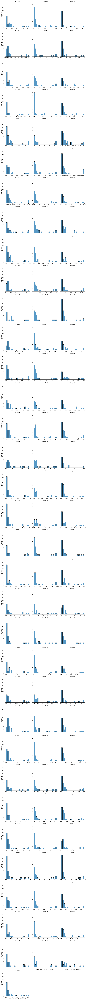

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Create a facet grid of histograms by sample
g = sns.FacetGrid(df, col="sample", col_wrap=3, height=4, sharex=False)
g.map_dataframe(sns.histplot, x="combined_measure", bins=20, edgecolor="black")
g.set_titles("Sample {col_name}")
g.set_axis_labels("Inter-Event Time (days) x Intensity", "Frequency")
g.tight_layout()
plt.show()

#### Max intensity per sample

In [57]:
df

,step,total_damage,affected,recovery_duration,sample,MRIOT,mean_shock_intensity,mean_shock_intensity_pct,number of events
5218,0,2.835784e+09,[JPN],83,0,OECD21-2018,0.000150,0.015000,29
5219,8,4.344727e+08,"[CHN, PHL, ROW]",50,0,OECD21-2018,0.000014,0.001414,29
5220,57,1.208093e+09,"[CHN, PHL]",528,0,OECD21-2018,0.000778,0.077760,29
5221,91,2.025782e+09,"[ESP, FRA, PRT, ROW]",60,0,OECD21-2018,0.000062,0.006189,29
5222,92,1.053790e+09,[ROW],65,0,OECD21-2018,0.000084,0.008379,29
...,...,...,...,...,...,...,...,...,...
4415,1413,3.072319e+08,"[CHN, JPN, TWN]",60,99,OECD21-2018,0.000061,0.006078,28
4416,1430,1.262911e+10,"[CHN, HKG, PHL]",127,99,OECD21-2018,0.000269,0.026903,28
4417,1435,2.176910e+09,"[ROW, USA]",51,99,OECD21-2018,0.000017,0.001665,28
4418,1457,1.012324e+10,"[CHN, TWN]",247,99,OECD21-2018,0.000471,0.047098,28


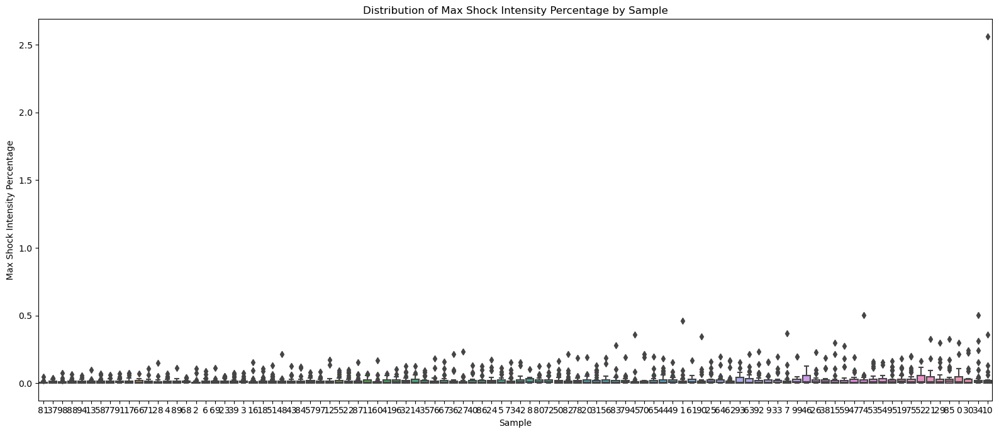

In [58]:
df = combined_df.copy()
df.sort_values(["mean_shock_intensity_pct"],inplace=True)
sorted_samples = df.groupby("sample")["mean_shock_intensity_pct"].mean().sort_values().index

plt.figure(figsize=(16, 7))
sns.boxplot(data=df, x="sample", y="mean_shock_intensity_pct", order=sorted_samples)
plt.title("Distribution of Max Shock Intensity Percentage by Sample")
plt.xlabel("Sample")
plt.ylabel("Max Shock Intensity Percentage")
plt.tight_layout()
plt.show()

#### Number of events with max intensity > 0.01% of capital destroyed

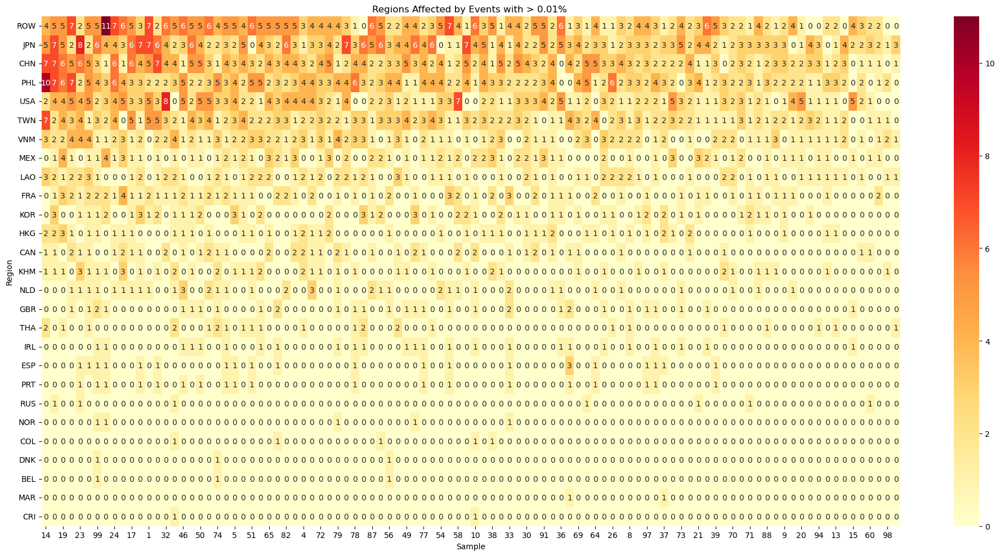

In [59]:
# Convert affected regions to individual rows
df = combined_df.copy()
affected_df = df.explode("affected")

# Filter high max_shock_intensity events (example threshold: 0.01)
high_intensity_df = affected_df[affected_df["mean_shock_intensity_pct"] > 0.01]

# Calculate the count of high-intensity events for each region
sample_region_counts = high_intensity_df.groupby(["sample", "affected"]).size().unstack(fill_value=0)
sample_region_counts.loc[:,"All Regions"] = sample_region_counts.sum(axis=1)
sample_region_counts.loc["All samples",:] = sample_region_counts.sum(axis=0)
sample_region_counts=sample_region_counts.T
sample_region_counts = sample_region_counts.astype(int)
sample_region_counts.sort_values(axis=1,by="All Regions",inplace=True,ascending=False)
sample_region_counts.sort_values(axis=0,by="All samples",inplace=True,ascending=False)

# Create a heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(data=sample_region_counts.drop("All samples",axis=1).drop("All Regions"), cmap="YlOrRd", annot=True, fmt="d")
plt.title("Regions Affected by Events with > 0.01% ")
plt.xlabel("Sample")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

## Looking at impact object

<GeoAxesSubplot:title={'center':'Expected annual impact'}>

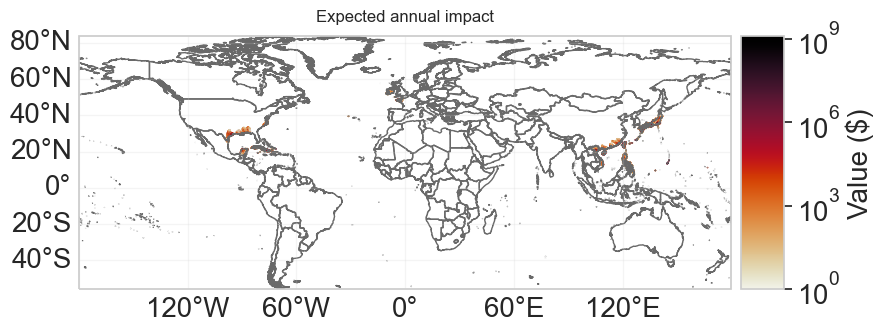

In [292]:
from matplotlib.colors import LogNorm

with open("../outputs/sample_96/direct_impact.pkl",'rb') as f:
        direct_impact = pkl.load(f)
direct_impact.unit = '$'
direct_impact.plot_hexbin_eai_exposure(pop_name=False, norm=LogNorm(vmin=1))

In [294]:
direct_impact.plot_hexbin_eai_exposure?

<GeoAxesSubplot:title={'center':'Expected annual impact'}>

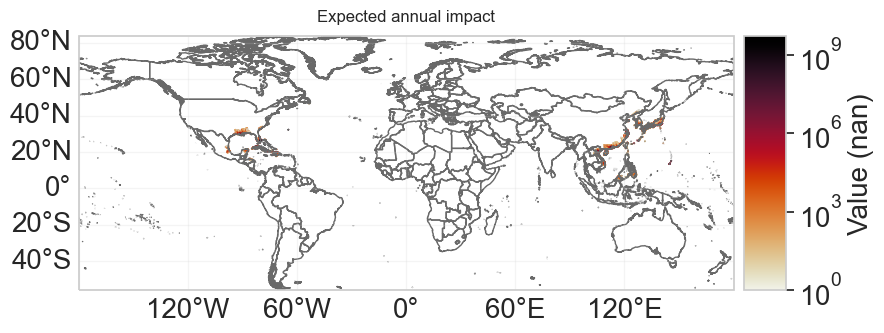

In [273]:
from matplotlib.colors import LogNorm

with open("../outputs/sample_30/direct_impact.pkl",'rb') as f:
        direct_impact = pkl.load(f)
direct_impact.plot_hexbin_eai_exposure(pop_name=False, norm=LogNorm(vmin=1))

## Indirect impacts results

### Setting up data

At the moment recent results are with OECD21 (more countries in west pacific)

In [18]:
mriot_name = "OECD21"

In [332]:
def add_europe(df,EU_regs):
    if "sector" in df.index.names:
        df.loc["Europe"] = df.loc[EU_regs].groupby("sector").sum()
    else:
        df.loc["Europe"] = df.loc[EU_regs].sum()
    return df

def get_affected_regions(group):
    affected_regions = group.loc[group["total direct impact"] > 0, ["region", "total direct impact"]]
    sorted_regions = affected_regions.sort_values(by="total direct impact", ascending=False)["region"].unique()
    return pd.Series({"affected regions": sorted_regions})

EU_regs_exio = ["AT","BE","BG","CH","DE","DK","EE","ES","FI","FR","GB","GR","HR","HU","IE","IT","LT","LU","LV","MT","NL","NO","PL","PT","RO","SE","SI","SK"]
EU_regs_wiod = ["AUT","BEL","BGR","CHE","DEU","DNK","EST","ESP","FIN","FRA","GBR","GRC","HRV","HUN","IRL","ITA","LTU","LUX","LVA","MLT","NLD","NOR","POL","PRT","ROU","SWE","SVN","SVK"]

if mriot_name == "OECD21":
    EU_regs = EU_regs_wiod
    with open("../outputs/OECD21-2018.pkl",'rb') as f:
        mriot = pkl.load(f)
else:
    EU_regs = EU_regs_exio
    with open("../outputs/EXIOBASE3-2010.pkl",'rb') as f:
        mriot = pkl.load(f)

VA_df = (mriot.x.T - mriot.Z.sum(axis=0)).loc['indout']
production_df = (mriot.x.T - mriot.Z.sum(axis=0)).loc['indout']
final_demand_df = mriot.Y.sum(axis=0).groupby("region").sum()

production_df = add_europe(production_df,EU_regs)
final_demand_df = add_europe(final_demand_df,EU_regs)

res_df = pd.read_parquet("../outputs/results_meta_df_OECD_update.parquet")
res_df = res_df.reset_index()

###################################################################################################################################################################
# The following lines sets the values for production_losses from production_realised such that positive values are production LOSSES and negative values are gains #
###################################################################################################################################################################
res_df.loc[(res_df["variable"]=="production_realised"),"total indirect impact"] = res_df.loc[(res_df["variable"]=="production_realised"),"total indirect impact"] * -1 # Positives == losses
res_df.replace(to_replace="production_realised", value="production_losses", inplace=True)

res_df["sample total direct damage"] = res_df.groupby(["sample","MRIOT","invtype","simtype","variable"])["total direct impact"].transform("sum")
affected_regions_df = res_df.groupby(["sample", "MRIOT", "invtype", "simtype", "variable"]).apply(get_affected_regions)
#affected_regions_df
res_df = res_df.groupby(["sample","MRIOT","invtype","simtype","variable", "region"])[["total direct impact","total indirect impact","sample total direct damage"]].agg(
    {"total direct impact":"sum",
     "total indirect impact":"sum",
     "sample total direct damage":"first"}).reset_index()
res_df = res_df.merge(affected_regions_df, left_on=["sample", "MRIOT", "invtype", "simtype", "variable"], right_index=True)
# List of regions
res_df.region = [
    country.alpha_3 if (country := countries.get(alpha_2=reg)) is not None else reg
    for reg in res_df.region
]

# custom aggregation to handle the affected regions
grouped = res_df.loc[res_df.region.isin(EU_regs)].groupby(["sample", "MRIOT", "invtype", "simtype", "variable"]).agg({
    "region": lambda x: "Europe",  # Set region to "Europe"
    "total direct impact": "sum",   # Sum total direct impact
    "total indirect impact": "sum",  # Sum total indirect impact
    "sample total direct damage": "first",  # Sum sample total direct damage
    "affected regions": "first"  # Use the first value of affected regions
}).reset_index()

# Display the updated DataFrame
res_df = pd.concat([res_df, grouped], ignore_index=True)
# Create a mask to filter rows where variable is "final_demand_unmet" or "production_losses"
mask = (res_df["variable"] == "final_demand_unmet") | (res_df["variable"] == "production_losses")

# Calculate 'relative indirect impact' based on variable

res_df.loc[mask, 'relative indirect impact'] = res_df.loc[mask, 'total indirect impact'] / res_df.loc[mask, 'region'].map(final_demand_df if 'final_demand_unmet' in res_df['variable'].values else production_region_df.groupby('region').sum())

dir_imp_df = combined_df[["sample","recovery_duration","mean_shock_intensity","number of events"]].groupby("sample",as_index=False).agg(
    {"recovery_duration":"sum",
     "mean_shock_intensity":"mean",
     "number of events":"first"
    })

res_df = res_df.merge(dir_imp_df, how="left", on="sample")

#### res_df
- sample : sample id
- MRIOT : MRIOT used for simulation
- invtype : type of inventory "scenario" use (example: 90-60 is 90 days stocks, 60 days rate)
- simtype : aggregated is all events taken together, separated is all events isolated then summed
- variable : variables looked at (e.g. production realised shows the cumulated difference between actual production during the simulation and initial production (*positive values are losses*))
- region : is the region looked at
- total direct impact : total direct impact (in the region) **/!\ in €**
- total indirect impact : total indirect impact (in the region) (the value of "variable") **/!\ in M€**
- sample total direct damage : total direct impact for the whole sample **/!\ in €**
- affected regions : all regions affected by at least one event **sorted by direct impact**.
- relative indirect impact : indirect loss relative to yearly output or final demand (Say total production losses in 1M€ and yearly production is 100M€ then relative indirect impact = 1/100 = 0.01)
- recovery_duration : sum of all recovery duration (has no real meaning)
- mean_shock_intensity : average of the "mean shock intensity of all TCs" of the sample
- number of events : total number of event of the sample 

In [216]:
EU_regs

['AUT',
 'BEL',
 'BGR',
 'CHE',
 'DEU',
 'DNK',
 'EST',
 'ESP',
 'FIN',
 'FRA',
 'GBR',
 'GRC',
 'HRV',
 'HUN',
 'IRL',
 'ITA',
 'LTU',
 'LUX',
 'LVA',
 'MLT',
 'NLD',
 'NOR',
 'POL',
 'PRT',
 'ROU',
 'SWE',
 'SVN',
 'SVK']

In [145]:
# quick check
assert not res_df.isna().any().any()

### Looking at specific samples

- ```(res_df.region=="Europe") & (res_df["total direct impact"]==0)``` to look at indirect losses in Europe from events that did not affect Europe.
- ```.sort_values("relative indirect impact").iloc[[0,1,2,3,4,5,6,7,-7,-6,-5,-4,-3,-2,-1]]``` to look at the most and least indirectly damaging events.

In [147]:
res_df.loc[(res_df.region=="Europe") & (res_df.variable=="production_losses") & (res_df["total direct impact"]==0)].sort_values("relative indirect impact").iloc[[0,1,2,3,4,5,6,7,-7,-6,-5,-4,-3,-2,-1]]

,sample,MRIOT,invtype,simtype,variable,region,total direct impact,total indirect impact,sample total direct damage,affected regions,relative indirect impact,recovery_duration,mean_shock_intensity,number of events
36243,30,EXIOBASE3-2010,9-6,separated,production_losses,Europe,0.0,-15550.958444,5.032241e+11,"[US, CN, MX, ROW, JP, TW, KR, CA]",-0.000857,4595,0.000409,20
36247,30,EXIOBASE3-2010,90-60,separated,production_losses,Europe,0.0,-15169.807641,5.032241e+11,"[US, CN, MX, ROW, JP, TW, KR, CA]",-0.000836,4595,0.000409,20
36061,7,EXIOBASE3-2010,90-60,aggregated,production_losses,Europe,0.0,-14780.962630,2.914052e+11,"[CN, ROW, US, MX, JP, KR, TW, CA, RU]",-0.000814,4005,0.000282,27
36057,7,EXIOBASE3-2010,9-6,aggregated,production_losses,Europe,0.0,-14311.322516,2.914052e+11,"[CN, ROW, US, MX, JP, KR, TW, CA, RU]",-0.000789,4005,0.000282,27
36063,7,EXIOBASE3-2010,90-60,separated,production_losses,Europe,0.0,-11269.083221,2.914052e+11,"[CN, ROW, US, MX, JP, KR, TW, CA, RU]",-0.000621,4005,0.000282,27
36059,7,EXIOBASE3-2010,9-6,separated,production_losses,Europe,0.0,-11077.407447,2.914052e+11,"[CN, ROW, US, MX, JP, KR, TW, CA, RU]",-0.000610,4005,0.000282,27
36241,30,EXIOBASE3-2010,9-6,aggregated,production_losses,Europe,0.0,-10884.840425,5.032241e+11,"[US, CN, MX, ROW, JP, TW, KR, CA]",-0.000600,4595,0.000409,20
36245,30,EXIOBASE3-2010,90-60,aggregated,production_losses,Europe,0.0,-10785.611274,5.032241e+11,"[US, CN, MX, ROW, JP, TW, KR, CA]",-0.000594,4595,0.000409,20
36113,14,EXIOBASE3-2010,9-6,aggregated,production_losses,Europe,0.0,1209.819098,1.288800e+11,"[CN, US, ROW, JP, TW, KR, CA, RU]",0.000067,5187,0.000188,41
36111,13,EXIOBASE3-2010,90-60,separated,production_losses,Europe,0.0,1673.391559,5.622809e+10,"[US, CN, JP, ROW, KR, TW, MX, CA]",0.000092,1931,0.000112,20


### Renaming for nice plots
- Names for plots
- Correct units

In [342]:
clean_df = res_df.copy()

# Replace variable values
clean_df['variable'] = clean_df['variable'].replace({'production_losses': 'Production losses', 'final_demand_unmet': 'Final demand losses'})
clean_df['simtype'] = clean_df['simtype'].replace({'aggregated': 'Yes', 'separated': 'No'})

# Replace column names
clean_df = clean_df.rename(columns={'total direct impact': 'Total direct impact (€ Billions)',
                                    'total indirect impact': 'Total indirect impact (€ Billions)',
                                    'sample total direct damage': 'Sample total direct impact (€ Billions)',
                                    'recovery_duration': 'Cumulated recovery time',
                                    'mean_shock_intensity': 'Mean sample shock intensity',
                                    'number of events': 'Sample number of events',
                                    'relative indirect impact' : 'Relative indirect impact',
                                    'variable':'Variable',
                                    'sample':'Sample',
                                    'region':'Region',
                                    'affected regions':'Affected regions'
                                   })
clean_df['Total direct impact (€ Billions)'] = clean_df['Total direct impact (€ Billions)'] / 1e9  # Divide by 10^9 as direct impact are in €
clean_df['Total indirect impact (€ Billions)'] = clean_df['Total indirect impact (€ Billions)'] / 1e3  # Divide by 10^3 as indirect impact are in M€
clean_df["Sample total direct impact (€ Billions)"] = clean_df["Sample total direct impact (€ Billions)"] / 1e9 # Divide by 10^9 as direct impact are in €
clean_df = clean_df.rename(columns={'invtype': 'Inv. Scenario', 'simtype': 'Event interaction ?'})
clean_df

,Sample,MRIOT,Inv. Scenario,Event interaction ?,Variable,Region,Total direct impact (€ Billions),Total indirect impact (€ Billions),Sample total direct impact (€ Billions),Affected regions,Relative indirect impact,Cumulated recovery time,Mean sample shock intensity,Sample number of events
0,0,OECD21-2018,9-6,Yes,Final demand losses,ARG,0.0,0.086901,338.314777,"[USA, JPN, ROW, CHN, TWN, VNM, KOR, MEX, PHL, ...",0.000180,6502,0.000397,29
1,0,OECD21-2018,9-6,Yes,Final demand losses,AUS,0.0,0.351991,338.314777,"[USA, JPN, ROW, CHN, TWN, VNM, KOR, MEX, PHL, ...",0.000262,6502,0.000397,29
2,0,OECD21-2018,9-6,Yes,Final demand losses,AUT,0.0,0.169756,338.314777,"[USA, JPN, ROW, CHN, TWN, VNM, KOR, MEX, PHL, ...",0.000405,6502,0.000397,29
3,0,OECD21-2018,9-6,Yes,Final demand losses,BEL,0.0,0.208576,338.314777,"[USA, JPN, ROW, CHN, TWN, VNM, KOR, MEX, PHL, ...",0.000388,6502,0.000397,29
4,0,OECD21-2018,9-6,Yes,Final demand losses,BGR,0.0,0.038649,338.314777,"[USA, JPN, ROW, CHN, TWN, VNM, KOR, MEX, PHL, ...",0.000639,6502,0.000397,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54395,99,OECD21-2018,9-6,No,Production losses,Europe,0.0,-2.178820,103.661265,"[USA, CHN, JPN, TWN, ROW, VNM, MEX, HKG, PHL, ...",-0.000120,4505,0.000288,28
54396,99,OECD21-2018,90-60,Yes,Final demand losses,Europe,0.0,2.072358,103.661265,"[USA, CHN, JPN, TWN, ROW, VNM, MEX, HKG, PHL, ...",0.000114,4505,0.000288,28
54397,99,OECD21-2018,90-60,Yes,Production losses,Europe,0.0,-2.878923,103.661265,"[USA, CHN, JPN, TWN, ROW, VNM, MEX, HKG, PHL, ...",-0.000159,4505,0.000288,28
54398,99,OECD21-2018,90-60,No,Final demand losses,Europe,0.0,4.622572,103.661265,"[USA, CHN, JPN, TWN, ROW, VNM, MEX, HKG, PHL, ...",0.000255,4505,0.000288,28


### Indirect Impact (Comparing aggregated events vs separated events)

#### Absolute losses

- Note that we use log and symlog scales
- symlog is for production losses as there are negative losses (ie gains) (otherwise we miss the data)
- change the ```variable = x ``` to either "Final demand losses" or "Production losses"
- change the ```inv_type = x ``` to either "9-6" or "90-60"
- you might want to further filter plot_df_europe with ```(plot_europe_df["total direct impact"]==0)```

In [151]:
clean_df[clean_df['Region']=='Europe']

,Sample,MRIOT,Inv. Scenario,Event interaction ?,Variable,Region,Total direct impact (€ Billions),Total indirect impact (€ Billions),Sample total direct impact (€ Billions),Affected regions,Relative indirect impact,Cumulated recovery time,Mean sample shock intensity,Sample number of events
36000,0,EXIOBASE3-2010,9-6,Yes,Final demand losses,Europe,1.665388,6.768522,340.50290,"[US, JP, ROW, CN, TW, KR, MX, PT, ES, FR]",0.000373,6502,0.000397,29
36001,0,EXIOBASE3-2010,9-6,Yes,Production losses,Europe,1.665388,-5.269263,340.50290,"[US, JP, ROW, CN, TW, KR, MX, PT, ES, FR]",-0.000290,6502,0.000397,29
36002,0,EXIOBASE3-2010,9-6,No,Final demand losses,Europe,1.665388,11.040925,340.50290,"[US, JP, ROW, CN, TW, KR, MX, PT, ES, FR]",0.000608,6502,0.000397,29
36003,0,EXIOBASE3-2010,9-6,No,Production losses,Europe,1.665388,-3.775625,340.50290,"[US, JP, ROW, CN, TW, KR, MX, PT, ES, FR]",-0.000208,6502,0.000397,29
36004,0,EXIOBASE3-2010,90-60,Yes,Final demand losses,Europe,1.665388,7.168474,340.50290,"[US, JP, ROW, CN, TW, KR, MX, PT, ES, FR]",0.000395,6502,0.000397,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36795,99,EXIOBASE3-2010,9-6,No,Production losses,Europe,20.470224,-2.531406,125.15689,"[US, CN, JP, IE, ROW, PT, TW, NL, GB, FR, ES, ...",-0.000139,4505,0.000288,28
36796,99,EXIOBASE3-2010,90-60,Yes,Final demand losses,Europe,20.470224,12.944147,125.15689,"[US, CN, JP, IE, ROW, PT, TW, NL, GB, FR, ES, ...",0.000713,4505,0.000288,28
36797,99,EXIOBASE3-2010,90-60,Yes,Production losses,Europe,20.470224,-5.733371,125.15689,"[US, CN, JP, IE, ROW, PT, TW, NL, GB, FR, ES, ...",-0.000316,4505,0.000288,28
36798,99,EXIOBASE3-2010,90-60,No,Final demand losses,Europe,20.470224,17.380436,125.15689,"[US, CN, JP, IE, ROW, PT, TW, NL, GB, FR, ES, ...",0.000958,4505,0.000288,28


<Figure size 640x480 with 0 Axes>

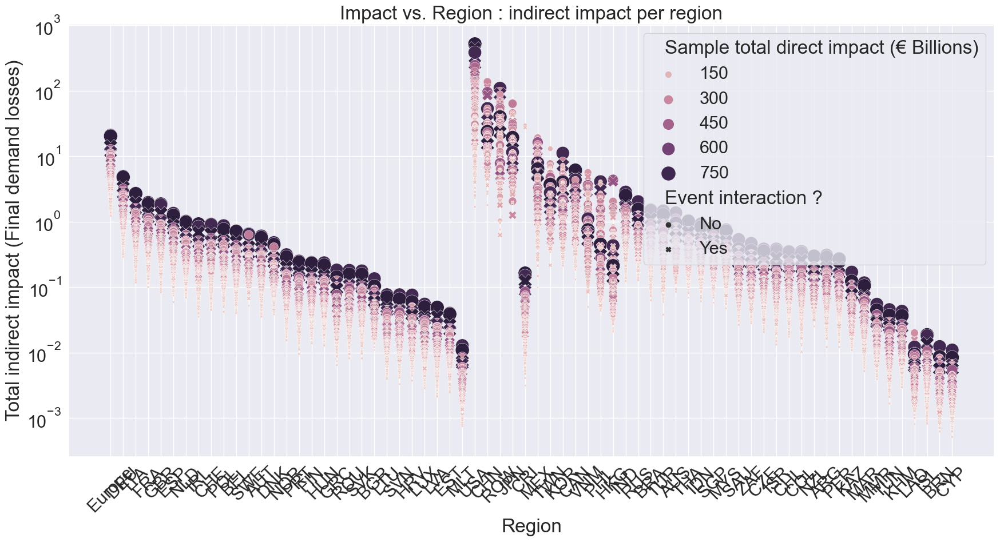

In [334]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

variable = "Final demand losses"
inv_type = "9-6"
y_value = "Total indirect impact (€ Billions)"
hue_var = size_var = "Sample total direct impact (€ Billions)"
style_var = "Event interaction ?"

plt.clf()
fig, ax = plt.subplots(figsize=(18, 10))

plot_df = clean_df.loc[(clean_df["Variable"] == variable) & (clean_df["Inv. Scenario"] == inv_type)].copy()
plot_df["Sample total direct impact (€ Billions)"] = plot_df["Sample total direct impact (€ Billions)"].apply(lambda x: max(1, x))  # Avoid log(0)
#plot_df =plot_df[plot_df['Region']=='Europe']
# Filter plot_df to include only regions from EU_regs
plot_df_europe = plot_df[(plot_df["Region"].isin(EU_regs)) | (plot_df["Region"]=="Europe")].sort_values(y_value, ascending=False)
plot_df = plot_df.loc[(~plot_df.Region.isin(EU_regs)) & (plot_df["Region"]!="Europe")].sort_values(y_value, ascending=False)

sns.scatterplot(data=plot_df_europe, x="Region", y=y_value, size=size_var, hue=hue_var, style=style_var, legend=False, sizes=(10, 300), ax=ax)
sns.scatterplot(data=plot_df, x="Region", y=y_value, size=size_var, hue=hue_var, style=style_var, sizes=(10, 300), ax=ax)

plt.xticks(rotation=45)
plt.xlabel("Region")
plt.ylabel(f"Total indirect impact ({variable})")
plt.title("Impact vs. Region : indirect impact per region")
if variable=="Production losses":
    plt.yscale("symlog")
else:
    plt.yscale("log")
#plt.legend(title=f"Sample total direct damage (Billion)", ncols=3)
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

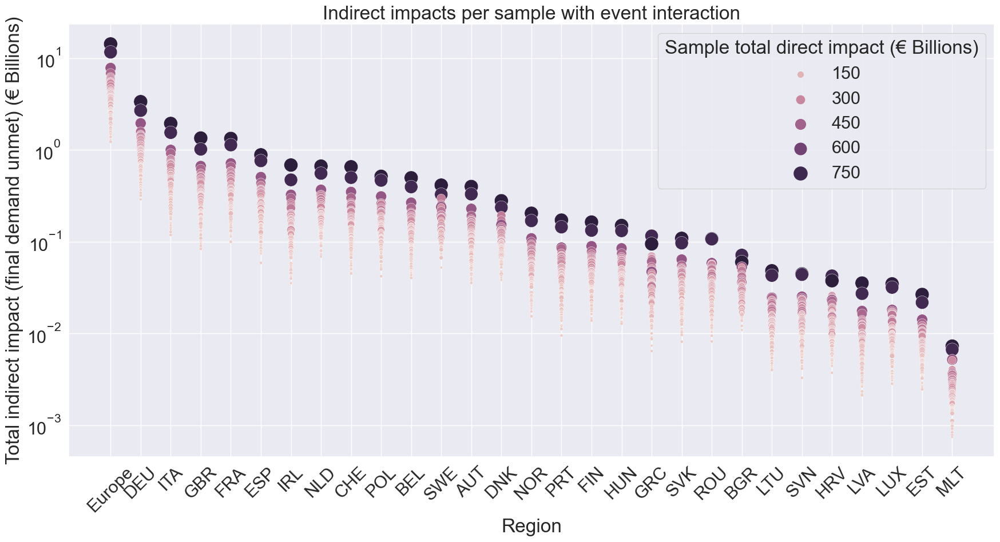

In [363]:
import matplotlib.pyplot as plt
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

# Assuming definitions for clean_df and EU_regs...

variable = "Final demand losses"
inv_type = "9-6"
y_value = "Total indirect impact (€ Billions)"
hue_var = size_var = "Sample total direct impact (€ Billions)"
style_var = "Event interaction ?"

plt.clf()
fig, ax = plt.subplots(figsize=(18, 10))

# Filter data frame for specified variable and investment type
plot_df = clean_df.loc[
    (clean_df["Variable"] == variable) & (clean_df["Inv. Scenario"] == inv_type)
].copy()

plot_df["Sample total direct impact (€ Billions)"] = plot_df[
    "Sample total direct impact (€ Billions)"
].apply(lambda x: max(1, x))  # Avoid log(0)

# Focus on "Europe" and its related regions with event interaction
# Assuming 'Yes' indicates event interaction; adjust if using boolean or different string values
plot_df_europe = plot_df[
    ((plot_df["Region"].isin(EU_regs)) | (plot_df["Region"] == "Europe")) & 
    (plot_df[style_var] == 'Yes')  # Adjust filter for event interaction
].sort_values(y_value, ascending=False)

sns.scatterplot(
    data=plot_df_europe,
    x="Region",
    y=y_value,
    size=size_var,
    hue=hue_var,
    legend=True,
    sizes=(10, 300),
    ax=ax,
)

plt.xticks(rotation=45)
plt.xlabel("Region")
plt.ylabel(f"Total indirect impact (final demand unmet) (€ Billions)")
plt.title("Indirect impacts per sample with event interaction")
if variable == "Production losses":
    plt.yscale("symlog")
else:
    plt.yscale("log")

plt.tight_layout()
plt.savefig("direct_indirect_impact.jpg")


#### Losses relative to economy size

<Figure size 640x480 with 0 Axes>

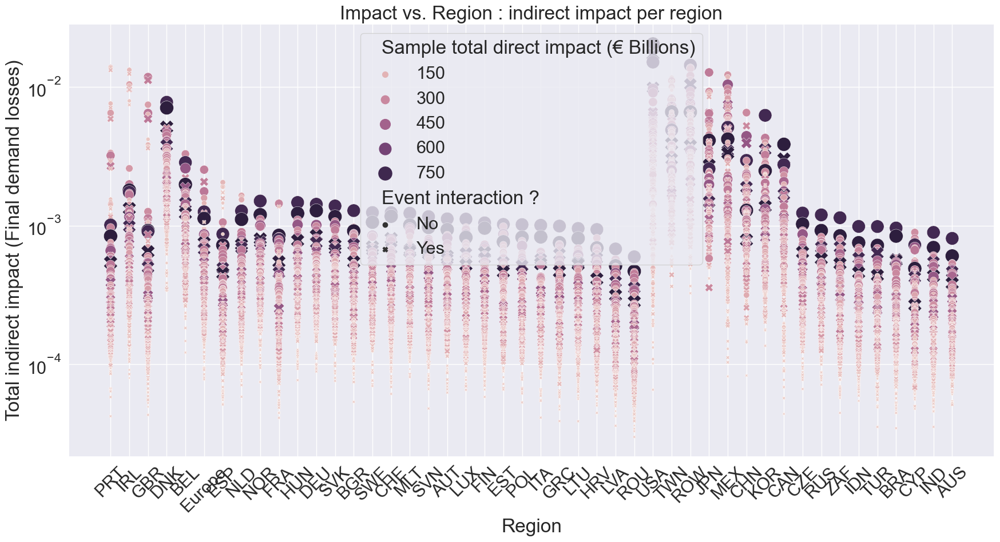

In [203]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

variable = "Final demand losses"
inv_type = "9-6"
y_value = "Relative indirect impact"
hue_var = size_var = "Sample total direct impact (€ Billions)"
style_var = "Event interaction ?"

plt.clf()
fig, ax = plt.subplots(figsize=(18, 10))

plot_df = clean_df.loc[(clean_df["Variable"] == variable) & (clean_df["Inv. Scenario"] == inv_type)].copy()
plot_df["Sample total direct impact (€ Billions)"] = plot_df["Sample total direct impact (€ Billions)"].apply(lambda x: max(1, x))  # Avoid log(0)

# Filter plot_df to include only regions from EU_regs
plot_df_europe = plot_df[(plot_df["Region"].isin(EU_regs)) | (plot_df["Region"]=="Europe")].sort_values(y_value, ascending=False)
plot_df = plot_df.loc[(~plot_df.Region.isin(EU_regs)) & (plot_df["Region"]!="Europe")].sort_values(y_value, ascending=False)

sns.scatterplot(data=plot_df_europe, x="Region", y=y_value, size=size_var, hue=hue_var, style=style_var, legend=False, sizes=(10, 300), ax=ax)
sns.scatterplot(data=plot_df, x="Region", y=y_value, size=size_var, hue=hue_var, style=style_var, sizes=(10, 300), ax=ax)

plt.xticks(rotation=45)
plt.xlabel("Region")
plt.ylabel(f"Total indirect impact ({variable})")
plt.title("Impact vs. Region : indirect impact per region")
if variable=="Production losses":
    plt.yscale("symlog")
else:
    plt.yscale("log")
#plt.legend(title=f"Sample total direct damage (Billion)", ncols=3)
plt.tight_layout()
plt.show()

### Indirect Impact on production (Comparing 9-6 inventories vs 90-60)

#### Absolute production losses

<Figure size 640x480 with 0 Axes>

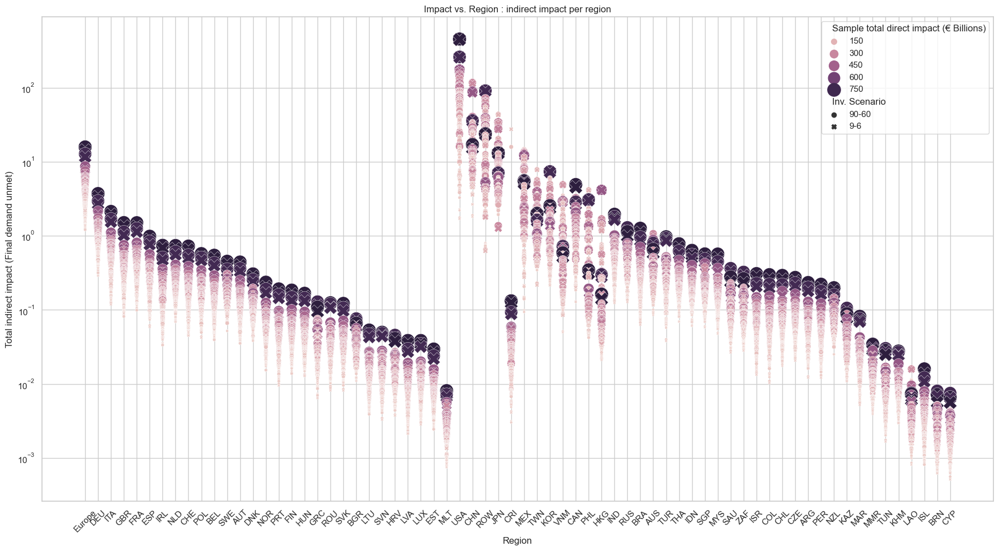

In [357]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

variable = "Final demand losses"
evnt_type = "Yes"
y_value = "Total indirect impact (€ Billions)"
hue_var = size_var = "Sample total direct impact (€ Billions)"
style_var = "Inv. Scenario"

plt.clf()
fig, ax = plt.subplots(figsize=(18, 10))

plot_df = clean_df.loc[(clean_df["Variable"] == variable) & (clean_df["Event interaction ?"] == evnt_type)].copy()
plot_df["Sample total direct impact (€ Billions)"] = plot_df["Sample total direct impact (€ Billions)"].apply(lambda x: max(1, x))  # Avoid log(0)

# Filter plot_df to include only regions from EU_regs
plot_df_europe = plot_df[(plot_df["Region"].isin(EU_regs)) | (plot_df["Region"]=="Europe")].sort_values(y_value, ascending=False)
plot_df = plot_df.loc[(~plot_df.Region.isin(EU_regs)) & (plot_df["Region"]!="Europe")].sort_values(y_value, ascending=False)

sns.scatterplot(data=plot_df_europe, x="Region", y=y_value, size=size_var, hue=hue_var, style=style_var, legend=False, sizes=(10, 300), ax=ax)
sns.scatterplot(data=plot_df, x="Region", y=y_value, size=size_var, hue=hue_var, style=style_var, sizes=(10, 300), ax=ax)

plt.xticks(rotation=45)
plt.xlabel("Region")
plt.ylabel(f"Total indirect impact (Final demand unmet)")
plt.title("Impact vs. Region : indirect impact per region")
if variable=="Production losses":
    plt.yscale("symlog")
else:
    plt.yscale("log")
#plt.legend(title=f"Sample total direct damage (Billion)", ncols=3)
plt.tight_layout()
plt.show()

#### Production losses relative to regional yearly production

### Ranking regions

#### Direct impacts

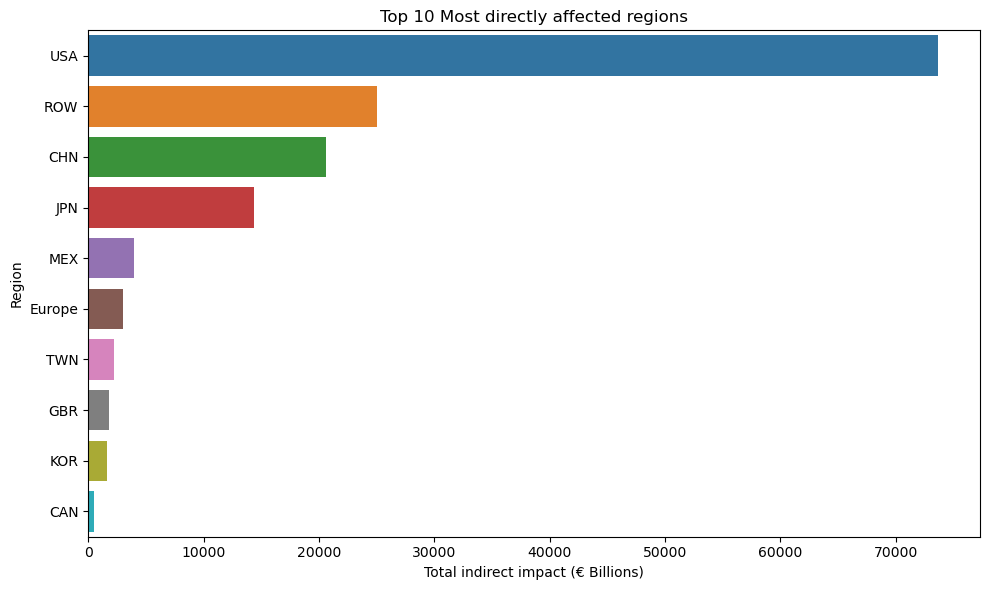

In [157]:
most_affected_regions = clean_df.groupby("Region")["Total direct impact (€ Billions)"].sum().sort_values(ascending=False).head(10)
plt.figure(figsize=(10, 6))
sns.barplot(x=most_affected_regions.values, y=most_affected_regions.index)
plt.xlabel("Total indirect impact (€ Billions)")
plt.ylabel("Region")
plt.title("Top 10 Most directly affected regions")
plt.tight_layout()
plt.show()

#### Absolute losses

In [362]:
sns.set(font_scale=2)


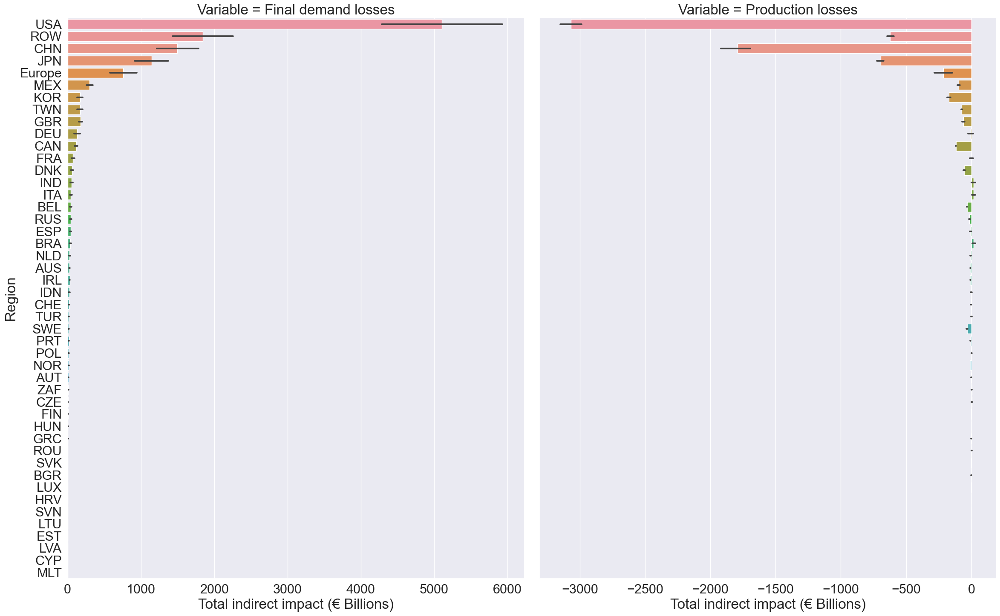

In [174]:
plot_df = clean_df.copy()

most_affected_regions = (plot_df.groupby(["Region",'Variable','Inv. Scenario','Event interaction ?'])["Total indirect impact (€ Billions)"].sum()).sort_values(ascending=False)
most_affected_regions = most_affected_regions.reset_index()
sns.catplot(most_affected_regions, kind="bar", x="Total indirect impact (€ Billions)", y="Region", col="Variable", sharex=False, height=15, aspect=0.8)

#### Relative indirect losses

Losses are expressed as the ratio of indirect losses / yearly production 

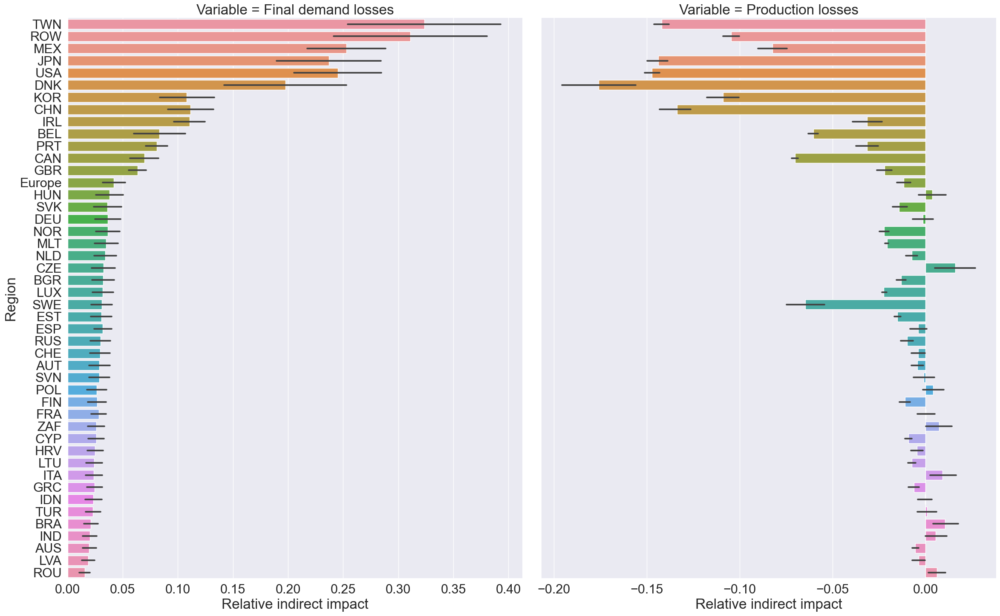

In [169]:
plot_df = clean_df.copy()

most_affected_regions = (plot_df.groupby(["Region",'Variable','Inv. Scenario','Event interaction ?'])["Relative indirect impact"].sum()).sort_values(ascending=False)
most_affected_regions = most_affected_regions.reset_index()
sns.catplot(most_affected_regions, kind="bar", x="Relative indirect impact", y="Region", col="Variable", sharex=False, height=15, aspect=0.8)

### Relative indirect impact vs Total Sample Direct Impact

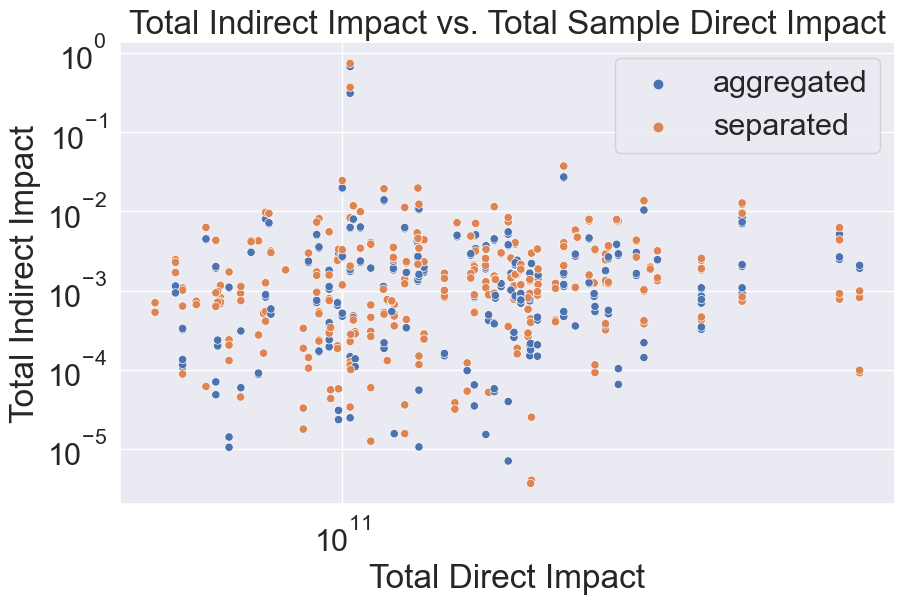

In [340]:
import seaborn as sns
import matplotlib.pyplot as plt

plot_df = res_df.loc[(res_df.variable=="production_losses")].copy()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=plot_df, x="sample total direct damage", y="relative indirect impact", hue="simtype")
plt.xlabel("Total Direct Impact")
plt.ylabel("Total Indirect Impact")
plt.title("Total Indirect Impact vs. Total Sample Direct Impact")
plt.xscale("log")
plt.yscale("log")
plt.legend()
plt.show()

### Average indirect impact

Absolute

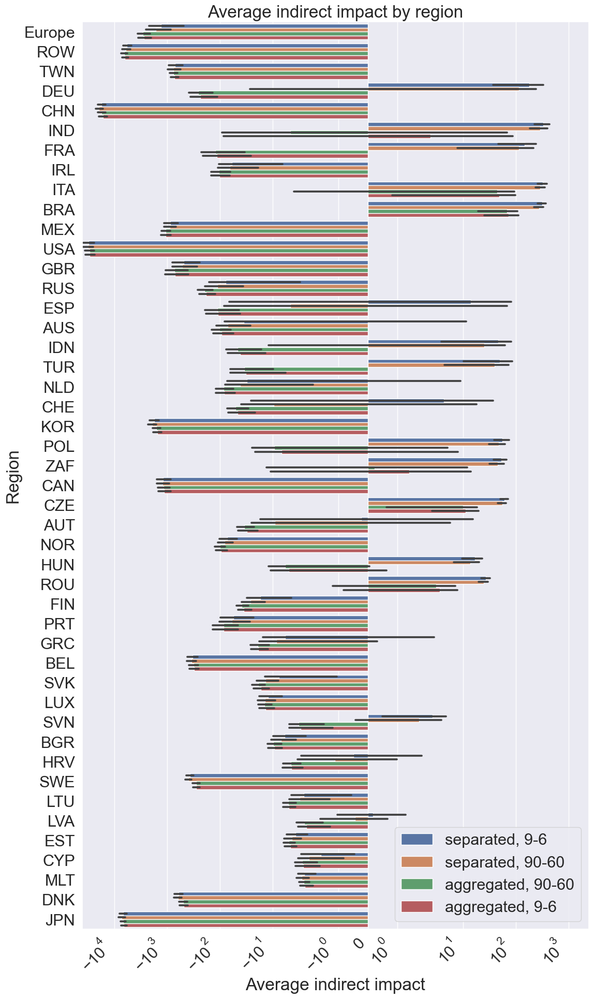

In [176]:
plt.figure(figsize=(12, 20))
plot_df=res_df.loc[res_df.variable=="production_losses"].sort_values(by="total indirect impact", ascending=False).copy()
hue = plot_df['simtype'].astype(str) + ', ' + plot_df['invtype'].astype(str)
sns.barplot(data=plot_df, y="region", x="total indirect impact", hue=hue)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Region")
plt.xlabel("Average indirect impact")
plt.title("Average indirect impact by region")
plt.tight_layout()
plt.xscale("symlog")  # Set x-axis to log scale
plt.show()

Relative

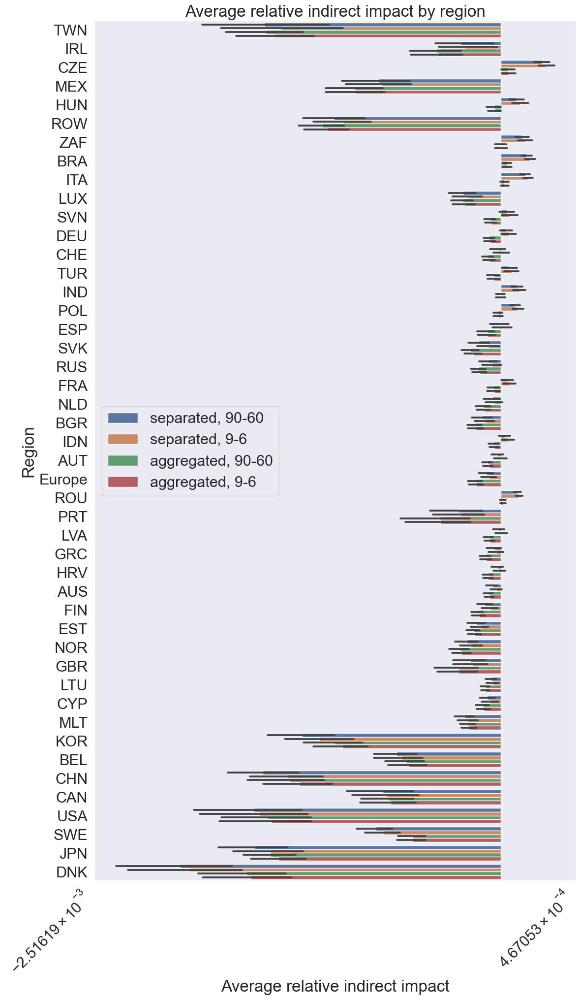

In [177]:
plt.figure(figsize=(12, 20))
plot_df=res_df.loc[res_df.variable=="production_losses"].sort_values(by="relative indirect impact", ascending=False).copy()
hue = plot_df['simtype'].astype(str) + ', ' + plot_df['invtype'].astype(str)
sns.barplot(data=plot_df, y="region", x="relative indirect impact", hue=hue)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Region")
plt.xlabel("Average relative indirect impact")
plt.title("Average relative indirect impact by region")
plt.tight_layout()
plt.xscale("symlog")  # Set x-axis to log scale
plt.show()

### Indirect damage over direct damage (sample) ratio

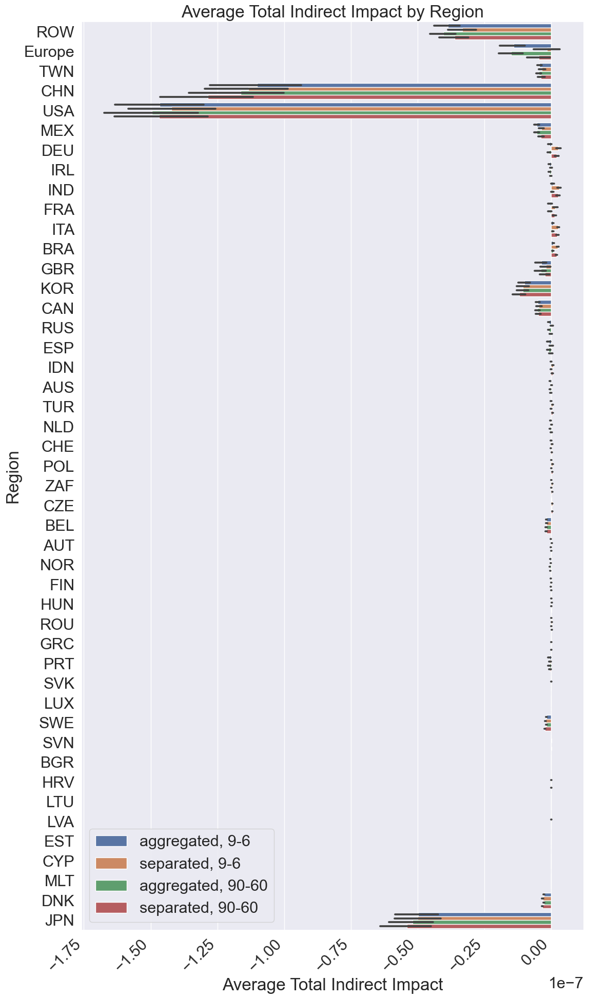

In [178]:
plt.figure(figsize=(12, 20))
plot_df=res_df.loc[res_df.variable=="production_losses"].copy()
hue = plot_df['simtype'].astype(str) + ', ' + plot_df['invtype'].astype(str)
plot_df["indirect damage over total sample damage"] = plot_df["total indirect impact"] / plot_df["sample total direct damage"]
plot_df.sort_values(by="indirect damage over total sample damage", ascending=False, inplace=True)
sns.barplot(data=plot_df, y="region", x="indirect damage over total sample damage", hue=hue)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Region")
plt.xlabel("Average Total Indirect Impact")
plt.title("Average Total Indirect Impact by Region")
plt.tight_layout()
#plt.xscale("symlog")  # Set x-axis to log scale
plt.show()

### Sample damage vs Indirect damage

Reminder: for "production_losses" negative values are gains

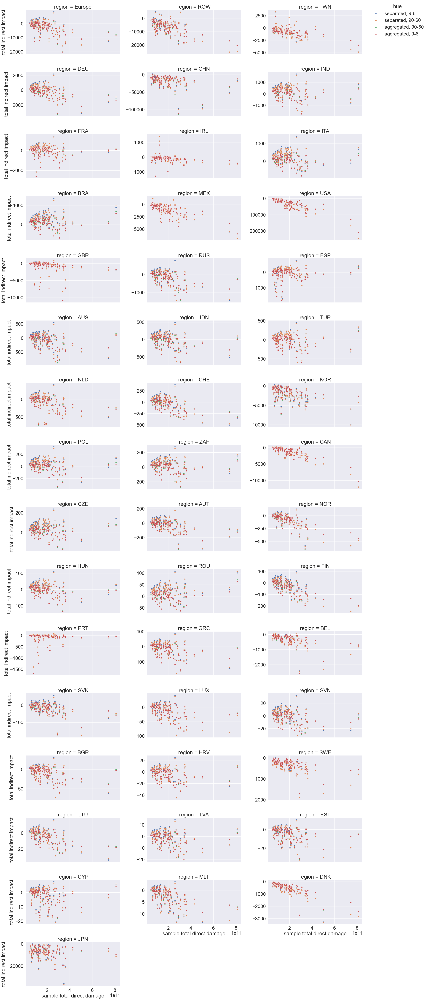

In [179]:
# Set up the grid layout

plot_df=res_df.loc[res_df.variable=="production_losses"].sort_values(by="total indirect impact", ascending=False).copy()
plot_df["hue"] = plot_df['simtype'].astype(str) + ', ' + plot_df['invtype'].astype(str)
g = sns.FacetGrid(plot_df, col="region", hue="hue", col_wrap=3, height=4, aspect=2, sharey=False, legend_out=True)

# Plot scatter plots
g.map_dataframe(sns.scatterplot,
                y="total indirect impact",
                x="sample total direct damage")

# Add legend
g.add_legend(loc="upper right")

# Adjust layout
g.tight_layout()

# Show the plot
plt.show()

<Figure size 1600x800 with 0 Axes>

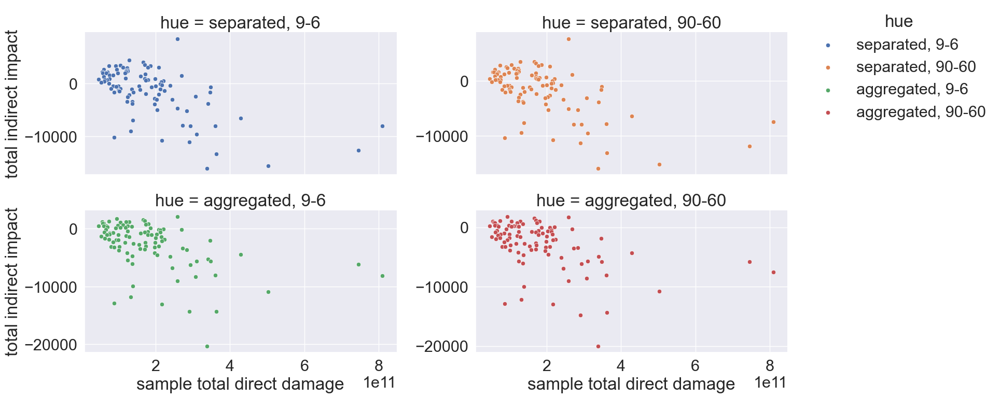

In [180]:
# Set up the grid layout
plt.figure(figsize=(16, 8))

plot_df=res_df.loc[(res_df.variable=="production_losses") & (res_df.region=="Europe")].sort_values(by="total indirect impact", ascending=False).copy()
# Set up the grid layout
plot_df["hue"] = plot_df['simtype'].astype(str) + ', ' + plot_df['invtype'].astype(str)
g = sns.FacetGrid(plot_df, col="hue", hue="hue", col_wrap=2, height=4, aspect=2, sharey=False, legend_out=True)

# Plot scatter plots
g.map_dataframe(sns.scatterplot,
                y="total indirect impact",
                x="sample total direct damage")

# Add legend
g.add_legend(loc="upper right")

# Adjust layout
g.tight_layout()

# Show the plot
plt.show()

In [ ]:
res_df#.sample(20)

# Exploration sample et événements

## Loading data [code to run]

In [182]:
import pickle as pkl
import pandas as pd

sample_number = 96

# Common to all:
with open(f"../outputs/sample_{sample_number}/OECD21-2018.pkl",'rb') as f:
    mriot = pkl.load(f)
    
# Sample specific
df_impact = pd.read_parquet(f"../outputs/sample_{sample_number}/OECD21-2018_df_impact.parquet")
df_impact = df_impact.reset_index(names=["step"])
df_impact["step"] = df_impact["step"].astype(int)
df_impact = df_impact.set_index("step", append=True)

meta_df_impact = pd.read_parquet(f"../outputs/sample_{sample_number}/OECD21-2018_meta_df_impact.parquet")
meta_df_impact = meta_df_impact.reset_index(names=["step"])
meta_df_impact["step"] = meta_df_impact["step"].astype(int)

# Simulation specific
inv_sce = "9-6"

production_df = pd.read_parquet(f"../outputs/sample_{sample_number}/OECD21-2018_{inv_sce}_event_aggregated/production_realised.parquet")
final_demand_df = pd.read_parquet(f"../outputs/sample_{sample_number}/OECD21-2018_{inv_sce}_event_aggregated/final_demand_unmet.parquet")

## df_impact [description / example of use]

- Impact direct par événement du sample
- Region,secteur en colonne
- Index = "id" et "step" de l'événement

In [183]:
df_impact_countries = df_impact.T.groupby("region").sum().T
df_impact_countries.drop(labels=df_impact_countries.columns[(df_impact_countries == 0).all()], axis=1)

,region,CHN,HKG,JPN,LAO,MEX,PHL,ROW,TWN,USA,VNM
,step,,,,,,,,,,
0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,4.729717e+09,0.000000e+00,0.000000e+00,0.000000e+00
1,122,0.000000e+00,0.000000e+00,3.317126e+08,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,141,0.000000e+00,0.000000e+00,4.422701e+09,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
3,153,0.000000e+00,0.000000e+00,2.754127e+09,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
4,168,0.000000e+00,0.000000e+00,9.204849e+08,0.000000,0.000000e+00,0.000000e+00,2.461526e+06,0.000000e+00,0.000000e+00,0.000000e+00
5,194,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,9.307413e+08,3.239900e+08,0.000000e+00,0.000000e+00,0.000000e+00
6,195,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,9.450254e+08,0.000000e+00,0.000000e+00,0.000000e+00
7,446,2.425132e+09,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,2.673222e+00,0.000000e+00,1.057511e+09,0.000000e+00,0.000000e+00
8,458,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,8.327786e+08,0.000000e+00,0.000000e+00,0.000000e+00,1.615608e+09,0.000000e+00


## meta_df_impact [description / example of use]

More aggregated info on each event of the sample
- total damage of the event
- affected regions by the event
- mean shock intensity : mean(impact/region_assets) over all affected region
- mean shock intensity pct : same but * 100 (ie %)
- recovery duration : computed as a function of mean_shock_intensity:

```python
def sigmoid_mapping(value, slope=2, midpoint=-3.5,
                    start_in_intrvl=0, end_in_intrvl=0.005,
                    start_out_intrvl=-5, end_out_intrvl=5, max_duration=1000):
    """Map interval to sigmoid scaled interval"""
    # Map the input value from [start_in, end_in] to [start_out, end_out]
    normalized_value = (value) / (end_in_intrvl - start_in_intrvl) * (end_out_intrvl - start_out_intrvl) - end_out_intrvl

    # Apply sigmoid function with adjustable slope and midpoint
    shifted_value = normalized_value - midpoint
    sigmoid_result = 1 / (1 + math.exp(-slope * shifted_value))

    # Scale the result to [0, max_duration]
    scaled_result = sigmoid_result * max_duration

    return scaled_result
```

In [30]:
meta_df_impact

,step,total_damage,affected,mean_shock_intensity,mean_shock_intensity_pct,recovery_duration
0,0,8.424389e+08,"[CHN, HKG, PHL]",0.000020,0.002000,51
1,68,8.590561e+08,"[CHN, TWN]",0.000289,0.028883,136
2,91,1.134691e+11,"[CHN, HKG, PHL, TWN]",0.002426,0.242607,999
3,101,3.458926e+09,[JPN],0.000183,0.018296,94
4,114,4.156446e+08,"[CHN, LAO, VNM]",0.000261,0.026060,124
5,395,4.838315e+08,[JPN],0.000026,0.002559,52
6,411,4.329870e+09,"[CHN, JPN, ROW]",0.000063,0.006312,60
7,481,1.106385e+09,"[JPN, ROW]",0.000044,0.004399,56
8,799,2.468237e+08,[CHN],0.000006,0.000592,49
9,1054,1.992737e+09,"[JPN, ROW]",0.000079,0.007923,64


## production_df [description / example of use]

For the specific simulation (MRIOT ; Inv. Scenario ; Event interaction (aggregated vs separated)): The production realised of each industry (Region,Sector) at each step

Can be normalized by "daily production" using:

```python
production_df_norm = production_df / production_df.loc[0]
```

In [116]:
production_df

region         ARG                                                  \
sector Agriculture Construction      Energy Manufacture     Mining   
step                                                                 
0       158.951711   108.809196  136.279525  603.857199  20.811996   
1       158.951711   108.809196  136.279525  603.857199  20.811996   
2       158.951688   108.809196  136.279450  603.857170  20.811993   
3       158.951674   108.809194  136.279425  603.857127  20.811988   
4       158.951673   108.809193  136.279414  603.857200  20.811985   
...            ...          ...         ...         ...        ...   
3398    158.953600   108.809307  136.282502  603.862750  20.812307   
3399    158.953598   108.809307  136.282499  603.862744  20.812307   
3400    158.953596   108.809307  136.282496  603.862738  20.812307   
3401    158.953594   108.809307  136.282493  603.862733  20.812306   
3402    158.953592   108.809307  136.282490  603.862727  20.812306   

region                                                             ...  \
sector       Other       Sales    Services   Transport  Utilities  ...   
step                                                               ...   
0       352.653033  261.131073  508.680148  128.988477  16.284921  ...   
1       352.653033  261.131073  508.680148  128.988477  16.284921  ...   
2       352.653033  261.131051  508.680140  128.988453  16.284921  ...   
3       352.653032  261.131036  508.680125  128.988442  16.284920  ...   
4       352.653031  261.131073  508.680135  128.988436  16.284920  ...   
...            ...         ...         ...         ...        ...  ...   
3398    352.653109  261.132797  508.681762  128.989442  16.284966  ...   
3399    352.653109  261.132795  508.681761  128.989441  16.284966  ...   
3400    352.653109  261.132793  508.681759  128.989440  16.284965  ...   
3401    352.653108  261.132791  508.681757  128.989439  16.284965  ...   
3402    352.653108  261.132789  508.681756  128.989438  16.284965  ...   

region         ZAF                                                  \
sector Agriculture Construction     Energy Manufacture      Mining   
step                                                                 
0        72.375978    77.396490  81.993531  455.946134  105.027795   
1        72.375978    77.396490  81.993531  455.946134  105.027795   
2        72.375965    77.396489  81.993446  455.946012  105.027376   
3        72.375955    77.396485  81.993393  455.945868  105.027302   
4        72.375962    77.396492  81.993370  455.946134  105.027271   
...            ...          ...        ...         ...         ...   
3398     72.376863    77.397118  81.995295  455.954594  105.032780   
3399     72.376862    77.397117  81.995294  455.954584  105.032775   
3400     72.376861    77.397116  81.995292  455.954574  105.032770   
3401     72.376860    77.397116  81.995290  455.954565  105.032765   
3402     72.376859    77.397115  81.995288  455.954555  105.032759   

region                                                             
sector       Other       Sales    Services   Transport  Utilities  
step                                                               
0       290.365961  167.981797  558.123853  109.435530  24.370579  
1       290.365961  167.981797  558.123853  109.435530  24.370579  
2       290.365961  167.981766  558.123845  109.435492  24.370579  
3       290.365952  167.981722  558.123785  109.435434  24.370572  
4       290.365945  167.981797  558.123754  109.435409  24.370570  
...            ...         ...         ...         ...        ...  
3398    290.366349  167.984079  558.126686  109.437217  24.370700  
3399    290.366349  167.984076  558.126683  109.437215  24.370699  
3400    290.366349  167.984074  558.126680  109.437213  24.370699  
3401    290.366348  167.984071  558.126677  109.437211  24.370699  
3402    290.366348  167.984068  558.126674  109.437209  24.370699  

[3403 rows x 670 columns]

## final_demand_df [description / example of use]

For the specific simulation (MRIOT ; Inv. Scenario ; Event interaction (aggregated vs separated)): The amount of final consumption that was not answered for each product (also Region,Sector) at each step.

In [124]:
final_demand_df

region         ARG                                                         \
sector Agriculture Construction Energy Manufacture Mining Other     Sales   
step                                                                        
0              0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   
1              0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   
2              0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   
3              0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   
4              0.0          0.0    0.0    0.000414    0.0   0.0  0.000271   
...            ...          ...    ...         ...    ...   ...       ...   
3398           0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   
3399           0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   
3400           0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   
3401           0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   
3402           0.0          0.0    0.0    0.000000    0.0   0.0  0.000000   

region                               ...         ZAF                      \
sector Services Transport Utilities  ... Agriculture Construction Energy   
step                                 ...                                   
0           0.0       0.0       0.0  ...         0.0     0.000000    0.0   
1           0.0       0.0       0.0  ...         0.0     0.000000    0.0   
2           0.0       0.0       0.0  ...         0.0     0.000000    0.0   
3           0.0       0.0       0.0  ...         0.0     0.000000    0.0   
4           0.0       0.0       0.0  ...         0.0     0.002936    0.0   
...         ...       ...       ...  ...         ...          ...    ...   
3398        0.0       0.0       0.0  ...         0.0     0.000000    0.0   
3399        0.0       0.0       0.0  ...         0.0     0.000000    0.0   
3400        0.0       0.0       0.0  ...         0.0     0.000000    0.0   
3401        0.0       0.0       0.0  ...         0.0     0.000000    0.0   
3402        0.0       0.0       0.0  ...         0.0     0.000000    0.0   

region                                                                  
sector Manufacture Mining Other     Sales Services Transport Utilities  
step                                                                    
0         0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  
1         0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  
2         0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  
3         0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  
4         0.000458    0.0   0.0  0.000237      0.0       0.0       0.0  
...            ...    ...   ...       ...      ...       ...       ...  
3398      0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  
3399      0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  
3400      0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  
3401      0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  
3402      0.000000    0.0   0.0  0.000000      0.0       0.0       0.0  

[3403 rows x 670 columns]

You can access yearly production / final demand within the MRIOT with:

```python
production = (mriot.x.T - mriot.Z.sum(axis=0)).loc['indout']
final_demand = mriot.Y.groupby("sector").sum().T.groupby("region").sum().T.stack().swaplevel().sort_index()
```

In [128]:
production = (mriot.x.T - mriot.Z.sum(axis=0)).loc['indout']
production

region  sector      
ARG     Services        114512.868533
        Agriculture      34014.311374
        Transport        22958.891262
        Other            93922.473216
        Manufacture      77007.865662
                            ...      
ZAF     Construction      9328.171026
        Energy           13205.111474
        Mining           15592.122811
        Utilities         4356.483831
        Sales            37573.168693
Name: indout, Length: 670, dtype: float64

In [184]:
final_demand = mriot.Y.groupby("sector").sum().T.groupby("region").sum().T.stack().swaplevel().sort_index()
final_demand

final_demand_per_supplier = mriot.Y.T.groupby("region").sum().T.unstack()
final_demand_per_supplier

region           ARG                                                         \
sector   Agriculture  Construction        Energy    Manufacture      Mining   
region                                                                        
ARG     11210.827430  31806.069999  11480.427580  105329.401750  790.810418   
AUS         1.042666      0.835481      6.214952      47.041143    0.353967   
AUT         1.103238      0.480951      0.201329     123.808704    0.081572   
BEL         0.150638      0.535553      0.074600      80.684291    0.013885   
BGR         0.134218      0.118767      0.063669       6.912317    0.005621   
...              ...           ...           ...            ...         ...   
TUR         2.205473      0.909860      0.341560     110.482229    0.438787   
TWN         0.042828      0.142521      0.024702     214.381623    0.006805   
USA        32.994141      0.758699     22.247655    2706.346983    2.484669   
VNM         0.593161      0.031383      0.000000     298.957826    0.000450   
ZAF         0.633015      0.192746      0.855163      75.199243    0.013856   

region                                                                        \
sector          Other         Sales      Services     Transport    Utilities   
region                                                                         
ARG     117665.116359  43077.295332  95307.938482  18527.740681  1976.441409   
AUS         10.555637     27.789691     38.038557     19.751981     0.038682   
AUT          9.917511     16.185271     31.353044     16.457655     0.077162   
BEL         11.497560     16.334643     59.289944     13.486141     0.143872   
BGR          0.473992      1.189724      2.278976      1.552839     0.007898   
...               ...           ...           ...           ...          ...   
TUR         22.023156     21.954197     41.076519     33.441890     0.125528   
TWN          4.644978     20.192557     23.850554     37.309791     0.007705   
USA        871.153095    870.065844   3781.171572   1046.533553     0.095138   
VNM         13.627216     19.175641     19.569034     12.756624     0.000449   
ZAF          6.645207     10.425867     31.694102     14.324519     0.154875   

region  ...           ZAF                                           \
sector  ...   Agriculture  Construction       Energy   Manufacture   
region  ...                                                          
ARG     ...      8.279176      0.000000     0.120181    199.623006   
AUS     ...      4.047261      1.618193     2.342546    155.750962   
AUT     ...      0.811071      0.420374     0.301992    192.424241   
BEL     ...      0.344847      1.009978     0.123060    191.954911   
BGR     ...      1.440208      0.332310     0.143045     36.252095   
...     ...           ...           ...          ...           ...   
TUR     ...      2.783884      1.332521     0.795167    264.398674   
TWN     ...      0.235260      0.132781     0.433528    238.581089   
USA     ...      9.285822      0.030097     2.979285   1772.629341   
VNM     ...     11.430801      0.017179     1.583264    254.917953   
ZAF     ...  10882.912372  21525.825661  6896.865438  47516.039073   

region                                                                      \
sector      Mining         Other         Sales      Services     Transport   
region                                                                       
ARG       0.001762      1.354695     50.015312     33.419985     27.384049   
AUS       0.539526     12.840227     70.352698     49.987183     38.548050   
AUT       0.089162      2.556091     26.895157     21.296958     13.925087   
BEL       0.033743      1.918534     38.211911     70.986965     32.265133   
BGR       0.022233      0.201635      8.846943      1.825109      3.043763   
...            ...           ...           ...           ...           ...   
TUR       0.722097      2.713367     49.087684     18.541911     33.585792   
TWN       0

## Explore a sample [Code to run (funcs + data treatment)]

### Funcs [Code to run (Functions definition)]

In [185]:
import os
import re
from pathlib import Path
import pandas as pd
from functools import reduce
from tqdm import tqdm

# Define a regex pattern to match the variable part of the file names
file_template = r"([^/]+)_([^/]+)_event_(\d+)/([\w-]+)\.parquet"

def extract_file_info(file_path):
    """Extract information from a file path using regex."""
    match = re.match(file_template, str(file_path))
    if match:
        mriot_name, inv_sce, event_id, variable = match.groups()
        return mriot_name, inv_sce, int(event_id), variable
    else:
        return None

def build_nested_dict(file_dict):
    """Build a nested dictionary from a dictionary of file paths."""
    nested_dict = {}
    for key, value in file_dict.items():
        mriot, inv_sce, event_id, variable = key
        mriot_dict = nested_dict.setdefault(mriot, {})
        inv_sce_dict = mriot_dict.setdefault(inv_sce, {})
        variable_dict = inv_sce_dict.setdefault(variable, {})
        variable_dict[event_id] = value
    return nested_dict

def compute_difference(file_paths, progress=False):
    """Compute the difference between all events and each event individually."""
    results = {}
    for mriot, mdict in file_paths.items():
        for inv_sce, inv_dict in mdict.items():
            for var, var_dict in inv_dict.items():
                all_ev_files = []
                if progress:
                    var_dict_iter = tqdm(var_dict.items(), desc=f"Processing {mriot}/{inv_sce}/{var}")
                else:
                    var_dict_iter = var_dict.items()
                
                for ev_id, file in var_dict.items():
                    all_ev_files.append(pd.read_parquet(file))
                
                all_ev_result = reduce(lambda x, y: x.add(y - y.loc[0], fill_value=0), all_ev_files)
                results.setdefault(mriot, {}).setdefault(inv_sce, {}).setdefault(var, {})[-99] = all_ev_result
                
                for ev_id_x, _ in var_dict_iter:
                    ev_x_files = []
                    for ev_id, file in var_dict.items():
                        if ev_id != ev_id_x:
                            ev_x_files.append(pd.read_parquet(file))
                    
                    ev_x_result = reduce(lambda x, y: x.add(y - y.loc[0], fill_value=0), ev_x_files)
                    difference = all_ev_result - (ev_x_result - ev_x_result.loc[0])
                    results.setdefault(mriot, {}).setdefault(inv_sce, {}).setdefault(var, {})[ev_id_x] = difference
    return results

def process_res_df(res_dict, sample_n, mriot, invtype, event_id, var):
    df = res_dict[mriot][invtype][var][event_id].copy()
    df_sum = (df-df.loc[0]).sum(axis=0).T.groupby("region").sum().T.to_frame("total indirect impact")
    df_sum["sample"] = sample_n
    df_sum["MRIOT"] = mriot
    df_sum["invtype"] = invtype
    df_sum["event_id"]= event_id
    df_sum["variable"] = var
    return df_sum

import pandas as pd

def aggregate_results(res_dict,sample_n):
    """Aggregate results from the nested dictionary and all_results_df."""
    aggregated_results = pd.DataFrame()
    
    for mriot, mdict in res_dict.items():
        for invtype, inv_dict in mdict.items():
            for var, var_dict in inv_dict.items():
                for event_n in var_dict.keys():
                    # Process individual results using process_res_df function
                    df = process_res_df(res_dict, sample_n, mriot, invtype, event_n, var).reset_index()

                    # Append the processed result to the aggregated results DataFrame
                    aggregated_results = pd.concat([aggregated_results, df], ignore_index=True)
    
    # Merge the aggregated results with all_results_df
    #merged_df = pd.merge(all_results_df, aggregated_results, on=['sample', 'MRIOT', 'invtype', 'event_id', 'variable'], how='left')
    
    return aggregated_results


### Compute indirect impact generated on an event basis (Time series)

The indirect impact generated by an event (considering interaction between events) is computed as:

IndImp(Ev) = IndImp(AllEv) - IndImp((AllEv - Ev))

The following code compute a dict ```results``` such that:

- ```results[mriot][inv_sce][var][-99]``` contains the time serie for the considered MRIOT, Inv. Scenario and variable for ALL events
- ```results[mriot][inv_sce][var][n]``` contains the time serie for the considered MRIOT, Inv. Scenario and variable for event ```n```

In [211]:
sample_number

96

In [195]:
sample_directory = Path(f"../outputs/sample_{sample_number}/")

# Create a dictionary to store the key-value pairs
file_dict = {}

# Iterate through the directory and its subdirectories
for file in sample_directory.rglob("*.parquet"):
    file_path = Path(file.parents[0].name + "/" + file.name)
    file_info = extract_file_info(file_path)
    if file_info:
        file_dict[file_info] = file.resolve()

# Build a nested dictionary from the file_dict
nested_dict = build_nested_dict(file_dict)

# Compute the difference between all events and each event individually
results = compute_difference(nested_dict, progress=True)

# Now, 'results' contains the computed differences

Processing OECD21-2018/9-6/final_demand_unmet: 100%|█| 26/26
Processing OECD21-2018/9-6/production_realised: 100%|█| 26/2
Processing OECD21-2018/90-60/final_demand_unmet: 100%|█| 26/
Processing OECD21-2018/90-60/production_realised: 100%|█| 26


#### Examples of use of ```results```

In [212]:
results

{'OECD21-2018': {'9-6': {'final_demand_unmet': {-99: region         ARG                                                         \
    sector Agriculture Construction    Energy Manufacture    Mining     Other   
    step                                                                        
    0         0.000000     0.000000  0.000000    0.000000  0.000000  0.000000   
    1         0.000000     0.000000  0.000000    0.000000  0.000000  0.000000   
    2         0.000000     0.000000  0.000026    0.000000  0.000001  0.000000   
    3         0.000000     0.000000  0.000000    0.000000  0.000000  0.000000   
    4         0.000000     0.000000  0.000000    0.006978  0.000000  0.000000   
    ...            ...          ...       ...         ...       ...       ...   
    3434      0.000011     0.000004  0.000016    0.000021  0.000002  0.000001   
    3435      0.000011     0.000004  0.000016    0.000021  0.000002  0.000001   
    3436      0.000011     0.000004  0.000016    0.000021  0

<AxesSubplot:title={'center':'Relative production variation considering all events in China'}, xlabel='step'>

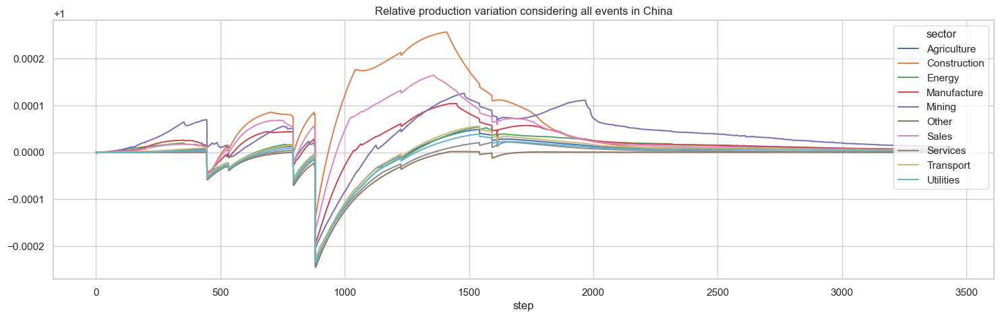

In [256]:
indirect_impact_from_all_ev = results["OECD21-2018"]["9-6"]["production_realised"][-99]
indirect_impact_from_all_ev_norm = indirect_impact_from_all_ev / indirect_impact_from_all_ev.loc[0]
indirect_impact_from_all_ev_norm.loc[:,"CHN"].plot(figsize=(18,5), title="Relative production variation considering all events in China")

In [241]:
indirect_impact_from_all_ev[country]

sector,Agriculture,Construction,Energy,Manufacture,Mining,Other,Sales,Services,Transport,Utilities
step,,,,,,,,,,
0,14.180674,49.626919,33.685185,254.83065,1.625873,64.362349,58.915504,142.977099,40.137889,4.683748
1,14.180674,49.626919,33.685185,254.83065,1.625873,64.362349,58.915504,142.977099,40.137889,4.683748
2,14.180674,49.626919,33.685185,254.83065,1.625873,64.362349,58.915504,142.977099,40.137889,4.683748
3,14.180674,49.626919,33.685185,254.83065,1.625873,64.362349,58.915504,142.977099,40.137889,4.683748
4,14.180674,49.626919,33.685185,254.83065,1.625873,64.362349,58.915504,142.977099,40.137889,4.683748
...,...,...,...,...,...,...,...,...,...,...
3434,14.180674,49.626919,33.685185,254.83065,1.625873,64.362349,58.915504,142.977099,40.137889,4.683748
3435,14.180674,49.626919,33.685185,254.83065,1.625873,64.362349,58.915504,142.977099,40.137889,4.683748
3436,14.180674,49.626919,33.685185,254.83065,1.625873,64.362349,58.915504,142.977099,40.137889,4.683748


In [252]:
EU_dfs = []
for country in EU_regs:
    EU_dfs.append(indirect_impact_from_all_ev[country])
indirect_impact_from_all_ev_eu = pd.concat(EU_dfs).groupby(level=0).sum()
indirect_impact_from_all_ev_eu_norm = indirect_impact_from_all_ev_eu / indirect_impact_from_all_ev_eu.loc[0]

In [277]:
1600/365

4.383561643835616

In [281]:
np.argmin(indirect_impact_from_all_ev_eu_norm.sum(axis=1))

3

<AxesSubplot:title={'center':'Relative production variation considering all events in Europe'}, xlabel='step'>

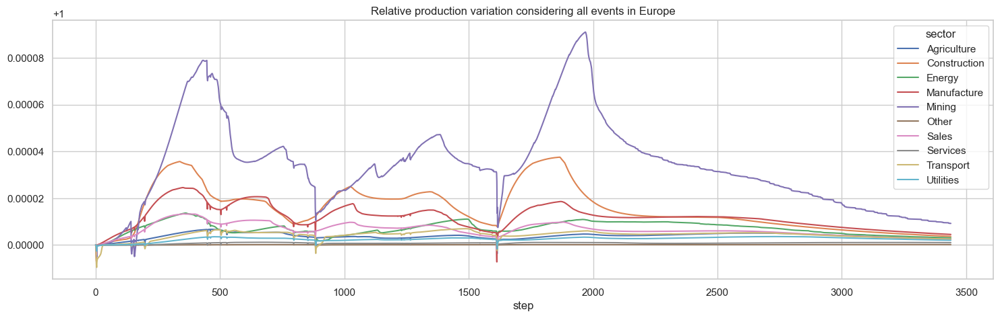

In [253]:
indirect_impact_from_all_ev_eu_norm.plot(figsize=(18,5), title="Relative production variation considering all events in Europe")

<AxesSubplot:title={'center':'Relative production variation considering only event 0 in China'}, xlabel='step'>

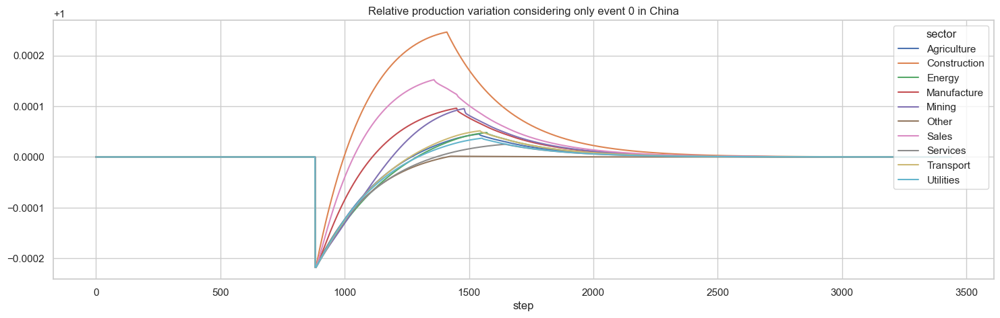

In [248]:
indirect_impact_from_all_ev = results["OECD21-2018"]["9-6"]["production_realised"][15]
indirect_impact_from_all_ev_norm = indirect_impact_from_all_ev / indirect_impact_from_all_ev.loc[0]

# Exemple 
indirect_impact_from_all_ev_norm.loc[:,"CHN"].plot(figsize=(18,5), title="Relative production variation considering only event 0 in China")

In [286]:
results["OECD21-2018"]["9-6"]["production_realised"].keys()

dict_keys([-99, 6, 1, 8, 11, 16, 20, 18, 9, 0, 7, 19, 21, 17, 10, 15, 12, 24, 23, 2, 5, 22, 25, 13, 14, 4, 3])

<AxesSubplot:title={'center':'Relative production variation considering all events in Europe'}, xlabel='step'>

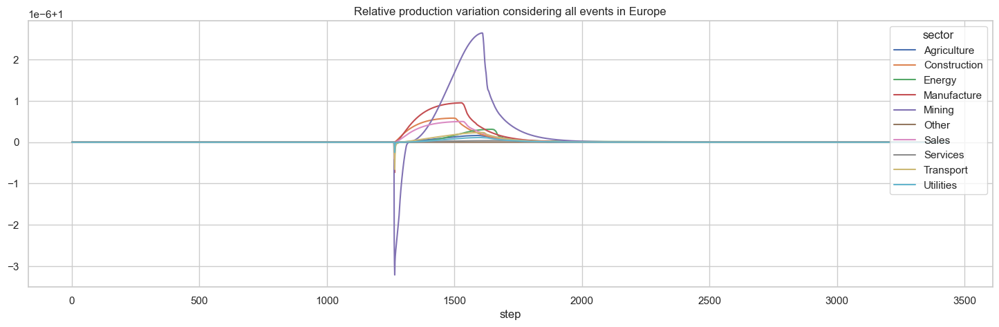

In [284]:
EU_dfs = []
indirect_impact_from_all_ev = results["OECD21-2018"]["9-6"]["production_realised"][20]

for country in EU_regs:
    EU_dfs.append(indirect_impact_from_all_ev[country])
indirect_impact_from_all_ev_eu = pd.concat(EU_dfs).groupby(level=0).sum()
indirect_impact_from_all_ev_eu_norm = indirect_impact_from_all_ev_eu / indirect_impact_from_all_ev_eu.loc[0]
indirect_impact_from_all_ev_eu_norm.plot(figsize=(18,5), title="Relative production variation considering all events in Europe")

### Compute indirect impact generated on an event basis (Aggregated)

```process_res_df()``` returns a DataFrame with indirect impact aggregated over the whole timeserie for a given mriot, invtype, event and variable.

indirect impact is given for all (region,sector) tuples

#### For one specific result :

In [198]:
df_agg = process_res_df(results, sample_n=96, mriot="OECD21-2018", invtype="9-6", event_id=6, var="production_realised")
df_agg

,total indirect impact,sample,MRIOT,invtype,event_id,variable
region,,,,,,
ARG,0.316652,96,OECD21-2018,9-6,6,production_realised
AUS,1.153947,96,OECD21-2018,9-6,6,production_realised
AUT,0.601717,96,OECD21-2018,9-6,6,production_realised
BEL,0.751151,96,OECD21-2018,9-6,6,production_realised
BGR,0.186603,96,OECD21-2018,9-6,6,production_realised
...,...,...,...,...,...,...
TUR,2.215832,96,OECD21-2018,9-6,6,production_realised
TWN,0.949948,96,OECD21-2018,9-6,6,production_realised
USA,6.436980,96,OECD21-2018,9-6,6,production_realised


#### For all results :

In [199]:
meta_df_agg = aggregate_results(results,96)

In [135]:
meta_df_agg

,region,total indirect impact,sample,MRIOT,invtype,event_id,variable
0,ARG,36.238981,96,OECD21-2018,9-6,-99,final_demand_unmet
1,AUS,277.867184,96,OECD21-2018,9-6,-99,final_demand_unmet
2,AUT,79.921121,96,OECD21-2018,9-6,-99,final_demand_unmet
3,BEL,90.225114,96,OECD21-2018,9-6,-99,final_demand_unmet
4,BGR,29.295918,96,OECD21-2018,9-6,-99,final_demand_unmet
...,...,...,...,...,...,...,...
7231,TUR,3.531343,96,OECD21-2018,90-60,7,production_realised
7232,TWN,7.903981,96,OECD21-2018,90-60,7,production_realised
7233,USA,47.186928,96,OECD21-2018,90-60,7,production_realised
7234,VNM,7.867258,96,OECD21-2018,90-60,7,production_realised


### Merging with direct impact:

Preparing direct impact

In [200]:
direct_impact_df = df_impact_countries.copy()
direct_impact_df = direct_impact_df / 10**6 # make it in the same unit as results (M€)
direct_impact_df = direct_impact_df.droplevel(1,axis=0)
direct_impact_df.columns.name = None
direct_impact_df = direct_impact_df.reset_index(names="event_id")
direct_impact_df

,event_id,ARG,AUS,AUT,BEL,BGR,BRA,BRN,CAN,CHE,...,SVK,SVN,SWE,THA,TUN,TUR,TWN,USA,VNM,ZAF
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
3,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
5,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
6,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
7,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1057.511105,0.000000,0.000000,0.0
8,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1615.607795,0.000000,0.0
9,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2295.334972,0.000000,0.0


Actually merging (+ reordering columns)

In [365]:
final_results = meta_df_agg.merge(direct_impact_df)[["sample","MRIOT","invtype","event_id","variable","region","total indirect impact"]+df_impact_countries.columns.to_list()]

final_results contains the following:

- sample : the sample considered (only the one you are working on at the moment, it is there for later scalability)
- MRIOT : same as above for MRIOT
- invtype : the Inv. Scenario
- event_id : the id of the event considered
- variable : the variable for "total indirect impact" column
- region : region considered for indirect impact
- total indirect impact : total indirect impact (for the event looked at, considering interaction with other event !)
- REGION_NAME : direct impact in REGION_NAME for the event considered

Be carefull when summing rows as the direct impact is duplicated for rows sharing the same event_id

Reminder : 
```
EU_regs_wiod = ["AUT","BEL","BGR","CHE","DEU","DNK","EST","ESP","FIN","FRA","GBR","GRC","HRV","HUN","IRL","ITA","LTU","LUX","LVA","MLT","NLD","NOR","POL","PRT","ROU","SWE","SVN","SVK"]
```

In [366]:
final_results.sort_values("total indirect impact")

,sample,MRIOT,invtype,event_id,variable,region,total indirect impact,ARG,AUS,AUT,...,SVK,SVN,SWE,THA,TUN,TUR,TWN,USA,VNM,ZAF
4798,96,OECD21-2018,90-60,23,production_realised,MEX,-2206.113801,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,295.54521,0.000000,0.0
4664,96,OECD21-2018,9-6,23,production_realised,MEX,-2142.434240,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,295.54521,0.000000,0.0
3750,96,OECD21-2018,90-60,10,production_realised,VNM,-154.794533,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,554.813954,0.0
3616,96,OECD21-2018,9-6,10,production_realised,VNM,-152.624275,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,554.813954,0.0
5342,96,OECD21-2018,90-60,5,production_realised,PHL,-144.845760,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2331,96,OECD21-2018,90-60,0,final_demand_unmet,ROW,3607.038255,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0
3762,96,OECD21-2018,9-6,15,final_demand_unmet,CHN,6887.441947,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1045.23212,0.00000,0.000000,0.0
3896,96,OECD21-2018,90-60,15,final_demand_unmet,CHN,7127.299572,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1045.23212,0.00000,0.000000,0.0
4597,96,OECD21-2018,9-6,23,final_demand_unmet,MEX,7814.965966,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,295.54521,0.000000,0.0


In [367]:
EU_regs_wiod = ["AUT","BEL","BGR","CHE","DEU","DNK","EST","ESP","FIN","FRA","GBR","GRC","HRV","HUN","IRL","ITA","LTU","LUX","LVA","MLT","NLD","NOR","POL","PRT","ROU","SWE","SVN","SVK"]

In [368]:
tmp = final_results.set_index(["sample","MRIOT","invtype","event_id","variable","region"]).loc[pd.IndexSlice[96,"OECD21-2018","90-60",:,"production_realised"]].sort_index()
EU_results = tmp.loc[pd.IndexSlice[:,EU_regs_wiod],:]
EU_results = EU_results.groupby("event_id").agg({k: 'sum' if k == 'total indirect impact' else "first" for k in EU_results.columns})

In [369]:
EU_results.drop(labels=EU_results.columns[(EU_results == 0).all()], axis=1)

,total indirect impact,CHN,HKG,JPN,LAO,MEX,PHL,ROW,TWN,USA,VNM
event_id,,,,,,,,,,,
0,204.736843,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4729.717442,0.000000,0.000000,0.000000
1,98.260670,0.000000,0.000000,331.712629,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,116.814541,0.000000,0.000000,4422.701381,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,67.112193,0.000000,0.000000,2754.127178,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,44.986875,0.000000,0.000000,920.484892,0.000000,0.000000,0.000000,2.461526,0.000000,0.000000,0.000000
5,52.181588,0.000000,0.000000,0.000000,0.000000,0.000000,930.741340,323.989957,0.000000,0.000000,0.000000
6,35.821729,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,945.025440,0.000000,0.000000,0.000000
7,85.051504,2425.131827,0.000000,0.000000,0.000000,0.000000,0.000003,0.000000,1057.511105,0.000000,0.000000
8,76.108583,0.000000,0.000000,0.000000,0.000000,832.778642,0.000000,0.000000,0.000000,1615.607795,0.000000


# Graph ideas for the paper

## Graph 1 : Indirect cost relative to direct cost at the global scale

In [105]:
clean_df.head(1)

,Sample,MRIOT,Inv. Scenario,Event interaction ?,Variable,Region,Total direct impact (€ Billions),Total indirect impact (€ Billions),Sample total direct impact (€ Billions),Affected regions,Relative indirect impact,Cumulated recovery time,Mean sample shock intensity,Sample number of events
0,0,OECD21-2018,9-6,Yes,Final demand losses,ARG,0.0,0.100439,339.980165,"[USA, JPN, ROW, CHN, TWN, VNM, KOR, MEX, PHL, ...",0.000208,6502,0.000397,29


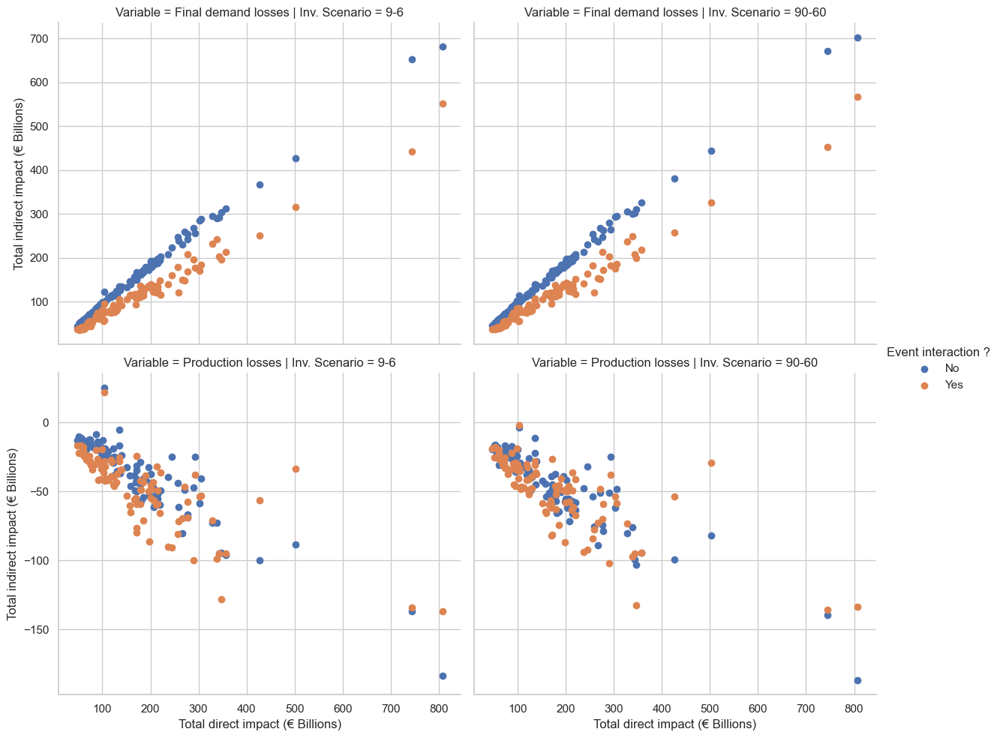

In [341]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# Sample DataFrame
df = clean_df.groupby(['Sample', 'MRIOT', 'Inv. Scenario', 'Event interaction ?', 'Variable'])[['Total direct impact (€ Billions)', 'Total indirect impact (€ Billions)']].sum().reset_index().copy()

# Replace column names
# Set the style of the plot
sns.set(style="whitegrid")

# Create a facet grid plot
g = sns.FacetGrid(df, row="Variable", col="Inv. Scenario", hue="Event interaction ?", sharey="row", aspect=1.2, height=5)

# Map the scatter plot on the facet grid
g.map(plt.scatter, "Total direct impact (€ Billions)", "Total indirect impact (€ Billions)")

#g.map(sns.regplot, "Global direct impact (€ Billions)", "Global indirect impact (€ Billions)", scatter=False, lowess=True)

# Add a legend
g.add_legend()

# Show the plot
plt.show()

## Graphe 1.1 : Indirect cost relative to direct cost at the global scale (Europe only)

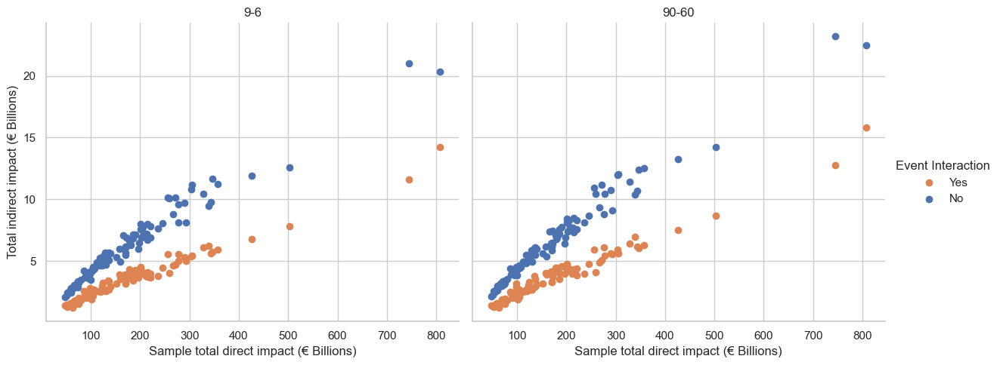

In [359]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit


import matplotlib.pyplot as plt

plt.rcParams['font.size'] = 16  # Set global font size
plt.rcParams['axes.labelsize'] = 18  # Set axes label size
plt.rcParams['axes.titlesize'] = 18  # Set title size
plt.rcParams['xtick.labelsize'] = 16  # Set x-tick label size
plt.rcParams['ytick.labelsize'] = 16  # Set y-tick label size
plt.rcParams['legend.fontsize'] = 16


# Sample DataFrame

# Filter for "Final demand losses"
df = clean_df.loc[
    (clean_df["Region"] == "Europe") & 
    (clean_df["Variable"] == "Final demand losses")
].groupby([
    'Sample', 'MRIOT', 'Inv. Scenario', 
    'Event interaction ?', 'Variable'
])[['Sample total direct impact (€ Billions)', 'Total indirect impact (€ Billions)']
].agg({
    'Sample total direct impact (€ Billions)': "first", 
    'Total indirect impact (€ Billions)': "sum"
}).reset_index().copy()

# Set the style of the plot
sns.set(style="whitegrid")

# Create a facet grid plot
g = sns.FacetGrid(
    df, col="Inv. Scenario", hue="Event interaction ?", 
    sharey="row", aspect=1.2, height=5
)

# Map the scatter plot on the facet grid
g.map(plt.scatter, "Sample total direct impact (€ Billions)", "Total indirect impact (€ Billions)")

# Customize the plot
g.set_axis_labels(
    "Sample total direct impact (€ Billions)", 
    "Total indirect impact (€ Billions)", 
)
g.set_titles(
    col_template="{col_name}", 
   # Adjust fontsize for titles
)

# Add a legend with specified fontsize
g.add_legend(title='Event Interaction',label_order=['Yes', 'No'])

# Show the plot
plt.show()


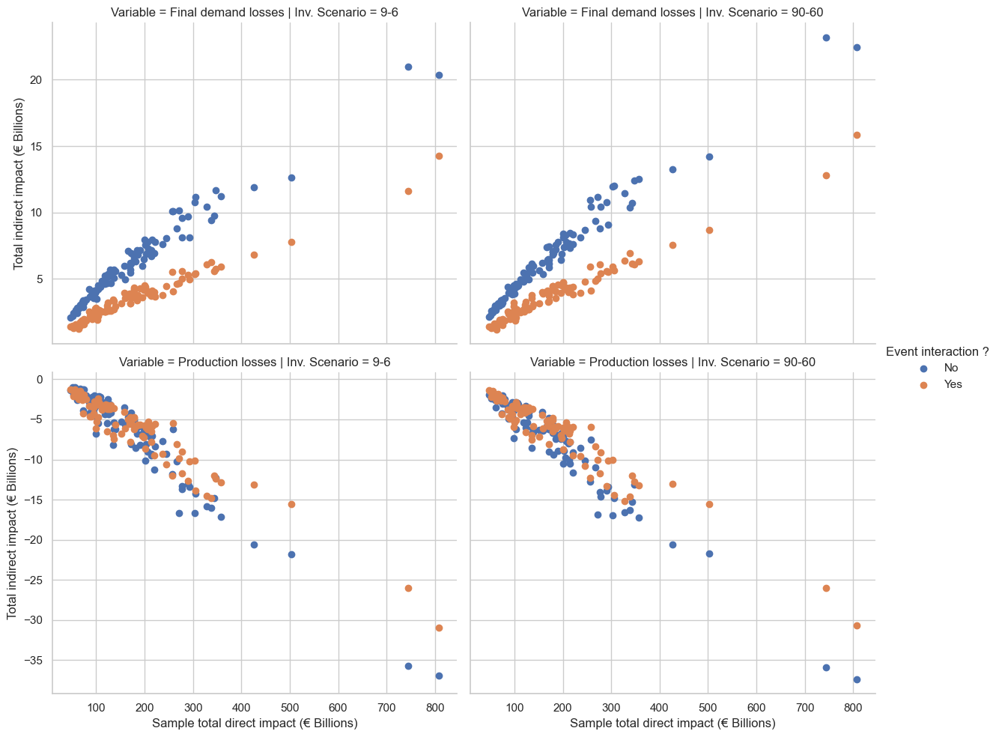

In [343]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# Sample DataFrame
df = clean_df.loc[clean_df["Region"]=="Europe"].groupby(['Sample',
                                                         'MRIOT',
                                                         'Inv. Scenario',
                                                         'Event interaction ?', 
                                                         'Variable']
                                                       )[['Sample total direct impact (€ Billions)', 'Total indirect impact (€ Billions)']].agg({'Sample total direct impact (€ Billions)':"first", 'Total indirect impact (€ Billions)':"sum"}).reset_index().copy()

# Replace column names
# Set the style of the plot
sns.set(style="whitegrid")

# Create a facet grid plot
g = sns.FacetGrid(df, row="Variable", col="Inv. Scenario", hue="Event interaction ?", sharey="row", aspect=1.2, height=5)

# Map the scatter plot on the facet grid
g.map(plt.scatter, "Sample total direct impact (€ Billions)", "Total indirect impact (€ Billions)")

#g.map(sns.regplot, "Global direct impact (€ Billions)", "Global indirect impact (€ Billions)", scatter=False, lowess=True)

# Add a legend
g.add_legend()

# Show the plot
plt.show()

## Graphe 2 [WIP] : 

In [205]:
df_direct_impact = pd.read_parquet("../outputs/full_df_impact.parquet").iloc[:,:-2]
df_direct_impact = df_direct_impact.groupby("sample").sum().stack()
df_direct_impact = df_direct_impact.reset_index()
df_direct_impact.rename(columns={0:"Direct_Impact"},inplace=True)
df_direct_impact

FileNotFoundError: [Errno 2] No such file or directory: '../outputs/full_df_impact.parquet'

In [206]:
df = res_df.loc[res_df.region=="Europe"].groupby(['sample', 'MRIOT', 'invtype', 'simtype', 'variable'])[['sample total direct damage', 'total indirect impact']].agg({'sample total direct damage':"first", 'total indirect impact':"sum"}).reset_index().copy()
df

,sample,MRIOT,invtype,simtype,variable,sample total direct damage,total indirect impact
0,0,EXIOBASE3-2010,9-6,aggregated,final_demand_unmet,3.405029e+11,6768.521563
1,0,EXIOBASE3-2010,9-6,aggregated,production_losses,3.405029e+11,-5269.262648
2,0,EXIOBASE3-2010,9-6,separated,final_demand_unmet,3.405029e+11,11040.924526
3,0,EXIOBASE3-2010,9-6,separated,production_losses,3.405029e+11,-3775.624797
4,0,EXIOBASE3-2010,90-60,aggregated,final_demand_unmet,3.405029e+11,7168.473543
...,...,...,...,...,...,...,...
795,99,EXIOBASE3-2010,9-6,separated,production_losses,1.251569e+11,-2531.406362
796,99,EXIOBASE3-2010,90-60,aggregated,final_demand_unmet,1.251569e+11,12944.147005
797,99,EXIOBASE3-2010,90-60,aggregated,production_losses,1.251569e+11,-5733.371201
798,99,EXIOBASE3-2010,90-60,separated,final_demand_unmet,1.251569e+11,17380.435567


In [207]:
# Merge the two DataFrames on 'Sample'
merged_df = pd.merge(df_direct_impact, df, on='sample')

# Group by 'Region' and aggregate direct impact and indirect impact
agg_df = merged_df.groupby(['sample',"MRIOT","invtype","simtype","variable",'region']).agg({'Direct_Impact': 'sum', 'total indirect impact': 'sum',"sample total direct damage":"first"}).reset_index()

# Sort the DataFrame by 'Direct_Impact'
agg_df = agg_df.sort_values(by='Direct_Impact', ascending=False)
agg_df = agg_df.loc[agg_df.Direct_Impact>0]
agg_df["direct impact share"] = agg_df["Direct_Impact"] / agg_df["sample total direct damage"]
agg_df["ratio"] = agg_df["total indirect impact"] * agg_df["direct impact share"]
agg_df = agg_df.groupby(["MRIOT","invtype","simtype","variable",'region'])[["ratio"]].mean().reset_index()
agg_df = agg_df.sort_values("ratio")

NameError: name 'df_direct_impact' is not defined

AttributeError: Rectangle.set() got an unexpected keyword argument 'colors'

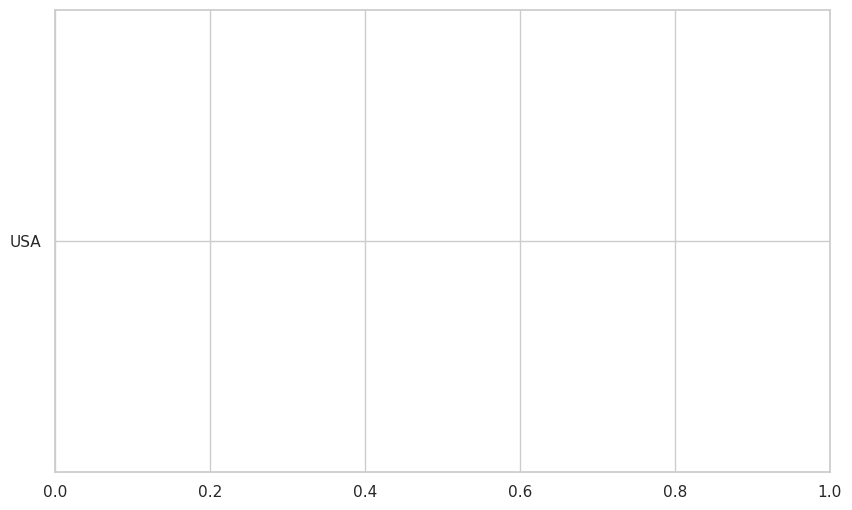

In [138]:
# Plot the data
plt.figure(figsize=(10, 6))
plt.barh(agg_df['region'], agg_df['ratio'], colors=agg_df["variable"], label='Indirect Impact in Europe')
plt.xlabel('Indirect Impact influence')
plt.ylabel('Directly Affected Region')
plt.title('Indirect Impact in Europe by Directly Affected Region')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.xscale("symlog")
# Show the plot
plt.show()

# Brouillon exploration

In [ ]:
aggregated_df = res_df[res_df["simtype"] == "aggregated"]
separated_df = res_df[res_df["simtype"] == "separated"]

# Merge aggregated and separated dataframes on specified columns
merged_df = pd.merge(aggregated_df, separated_df, on=["sample", "MRIOT", "invtype", "variable", "region"], suffixes=('','_separated'))

# Calculate the difference and create 'difference' rows
merged_df["total indirect impact"] = merged_df["total indirect impact"] - merged_df["total indirect impact_separated"]
merged_df["simtype"] = "difference"
merged_df = merged_df.loc[:, ~merged_df.columns.str.endswith('_separated')]
merged_df

mask = (merged_df["variable"] == "final_demand_unmet") | (merged_df["variable"] == "production_losses")
# Calculate 'relative indirect impact' based on variable
merged_df.loc[mask, 'relative indirect impact'] = merged_df.loc[mask, 'total indirect impact'] / merged_df.loc[mask, 'region'].map(final_demand_df if 'final_demand_unmet' in merged_df['variable'].values else production_region_df.groupby('region').sum())

# Append the 'difference' rows to the original dataframe
result_df = pd.concat([res_df, merged_df], ignore_index=True)
diff_df = result_df.filter(regex='^(?!.*(_separated|_aggregated)$)')
diff_df

In [ ]:
diff_df.loc[(diff_df.variable=="production_losses") & (diff_df.region=="Europe") & (diff_df["total direct impact"]==0) & (diff_df.simtype=="difference")].sort_values(by="relative indirect impact", ascending=False)

In [ ]:
# Set up the grid layout
plt.figure(figsize=(16, 8))

plot_df=diff_df.loc[(diff_df.variable=="production_losses") & (diff_df.region=="Europe") & (diff_df.simtype=="difference")].sort_values(by="total indirect impact", ascending=False).copy()
# Set up the grid layout
plot_df["hue"] = plot_df['simtype'].astype(str) + ', ' + plot_df['invtype'].astype(str)
g = sns.FacetGrid(plot_df, col="hue", hue="hue", col_wrap=2, height=4, aspect=2, sharey=False, legend_out=True)

# Plot scatter plots
g.map_dataframe(sns.scatterplot,
                y="total indirect impact",
                x="sample total direct damage")

# Add legend
g.add_legend(loc="upper right")

# Adjust layout
g.tight_layout()

# Show the plot
plt.show()

In [ ]:
diff_df.loc[(diff_df.variable=="production_losses") & (diff_df.region=="Europe") & (diff_df.simtype=="difference")].sort_values(by="relative indirect impact", ascending=False)

In [ ]:
combined_df.loc[(combined_df["sample"]==30)]

In [ ]:
combined_df.loc[(combined_df["sample"]==7)]

In [ ]:
import pandas as pd
import pickle as pkl
import math

def sigmoid_mapping(value, slope, midpoint,
                    start_in_intrvl=0, end_in_intrvl=0.005,
                    start_out_intrvl=-5, end_out_intrvl=5, max_duration=1000):
    """Map interval to sigmoid scaled interval"""
    # Map the input value from [start_in, end_in] to [start_out, end_out]
    normalized_value = (value) / (end_in_intrvl - start_in_intrvl) * (end_out_intrvl - start_out_intrvl) - end_out_intrvl

    # Apply sigmoid function with adjustable slope and midpoint
    shifted_value = normalized_value - midpoint
    sigmoid_result = 1 / (1 + math.exp(-slope * shifted_value))

    # Scale the result to [0, max_duration]
    scaled_result = sigmoid_result * max_duration

    return scaled_result


df_impact = pd.read_parquet("../outputs/EXIOBASE3-2010_df_impact.parquet")
with open("../outputs/sample_0/EXIOBASE3-2010_supchain.pkl","rb") as f:
    supchain = pkl.load(f)
meta_df_impact = df_impact.sum(axis=1).to_frame("total_damage").rename_axis("step")#.reset_index()
meta_df_impact["affected"] = df_impact.apply(lambda row:row[row>0].index.get_level_values(0).unique().to_list(), axis=1)
tmp = (df_impact / supchain.secs_exp.iloc[0]).groupby("region",axis=1).min().stack()
meta_df_impact["mean_shock_intensity"] = tmp.loc[tmp!=0].groupby(level=0).mean()
meta_df_impact["mean_shock_intensity_pct"] = meta_df_impact["mean_shock_intensity"]*100
meta_df_impact["recovery_duration"] = meta_df_impact["mean_shock_intensity"].apply(lambda x : sigmoid_mapping(x,slope=2, midpoint=-3.5)).round().astype(int)


In [ ]:
(df_impact / supchain.secs_exp.iloc[0]).groupby("region",axis=1).min()

In [ ]:
meta_df_impact

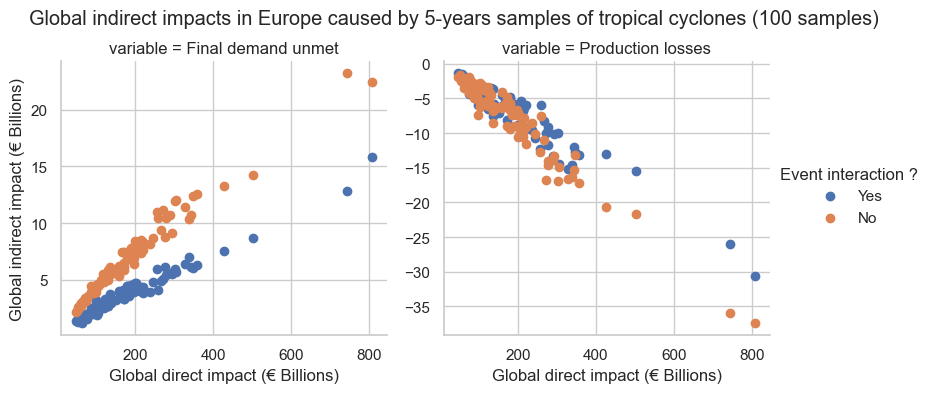

In [355]:
import seaborn as sns
import numpy as np
from scipy.optimize import curve_fit

# Sample DataFrame
df = res_df.loc[res_df.region=="Europe"].groupby(['sample', 'MRIOT', 'invtype', 'simtype', 'variable'])[['sample total direct damage', 'total indirect impact']].agg({'sample total direct damage':"first", 'total indirect impact':"sum"}).reset_index().copy()

# Replace variable values
df['variable'] = df['variable'].replace({'production_losses': 'Production losses', 'final_demand_unmet': 'Final demand unmet'})
df['simtype'] = df['simtype'].replace({'aggregated': 'Yes', 'separated': 'No'})

# Replace column names
df = df.rename(columns={'sample total direct damage': 'Global direct impact (€ Billions)', 'total indirect impact': 'Global indirect impact (€ Billions)'})
df['Global direct impact (€ Billions)'] = df['Global direct impact (€ Billions)'] / 1e9  # Divide by 10^9
df['Global indirect impact (€ Billions)'] = df['Global indirect impact (€ Billions)'] / 1e3  # Divide by 10^3
df = df.rename(columns={'invtype': 'Inv. Scenario', 'simtype': 'Event interaction ?'})

df = df.loc[df["Inv. Scenario"]=="90-60"]
# Set the style of the plot
sns.set(style="whitegrid")

# Create a facet grid plot
g = sns.FacetGrid(df, col="variable", hue="Event interaction ?", sharey=False, aspect=1, height=4)

# Map the scatter plot on the facet grid
g.map(plt.scatter, "Global direct impact (€ Billions)", "Global indirect impact (€ Billions)")

#g.map(sns.regplot, "Global direct impact (€ Billions)", "Global indirect impact (€ Billions)", scatter=False, lowess=True)

# Add a legend
g.add_legend()

g.fig.subplots_adjust(top=0.85) # adjust the Figure in rp
g.fig.suptitle('Global indirect impacts in Europe caused by 5-years samples of tropical cyclones (100 samples)')
# Show the plot
plt.show()

/home/sjuhel/mambaforge-pypy3/envs/versa/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/sjuhel/mambaforge-pypy3/envs/versa/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/sjuhel/mambaforge-pypy3/envs/versa/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


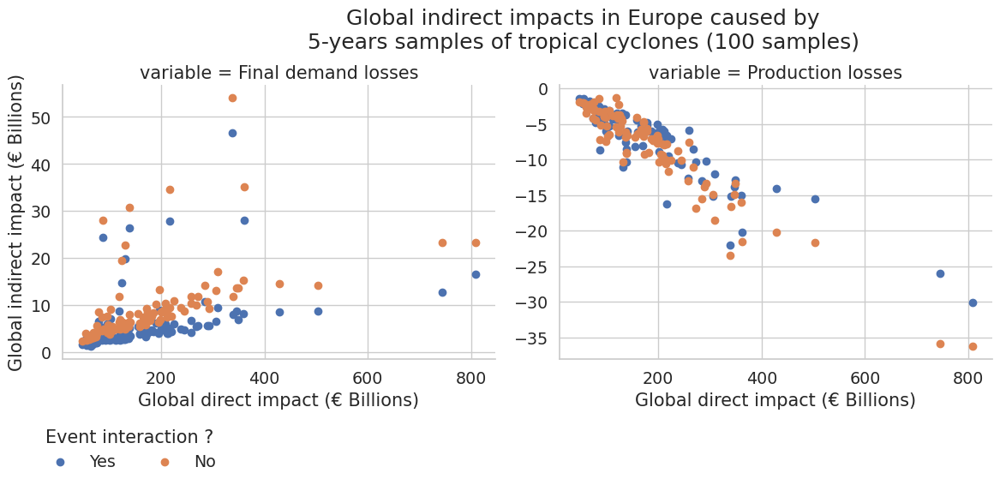

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# Sample DataFrame
df = res_df.loc[res_df.region=="Europe"].groupby(['sample', 'MRIOT', 'invtype', 'simtype', 'variable'])[['sample total direct damage', 'total indirect impact']].agg({'sample total direct damage':"first", 'total indirect impact':"sum"}).reset_index().copy()

# Replace variable values
df['variable'] = df['variable'].replace({'production_losses': 'Production losses', 'final_demand_unmet': 'Final demand losses'})
df['simtype'] = df['simtype'].replace({'aggregated': 'Yes', 'separated': 'No'})

# Replace column names
df = df.rename(columns={'sample total direct damage': 'Global direct impact (€ Billions)', 'total indirect impact': 'Global indirect impact (€ Billions)'})
df['Global direct impact (€ Billions)'] = df['Global direct impact (€ Billions)'] / 1e9  # Divide by 10^9
df['Global indirect impact (€ Billions)'] = df['Global indirect impact (€ Billions)'] / 1e3  # Divide by 10^3
df = df.rename(columns={'invtype': 'Inv. Scenario', 'simtype': 'Event interaction ?'})

df = df.loc[df["Inv. Scenario"]=="90-60"]

# Set the style of the plot
sns.set(style="whitegrid",font_scale=1.25)
#sns.set_context("talk")

# Create a facet grid plot
g = sns.FacetGrid(df, col="variable", hue="Event interaction ?", sharey=False, aspect=1.2, height=5)

# Map the scatter plot on the facet grid
g.map(plt.scatter, "Global direct impact (€ Billions)", "Global indirect impact (€ Billions)")

#g.map(sns.regplot, "Global direct impact (€ Billions)", "Global indirect impact (€ Billions)", scatter=False, lowess=True)
#g.set_titles(col_template="Inv. Scenario {col_name}", row_template="{row_name}")
# Add a legend
g.add_legend(ncol=2, bbox_to_anchor=(.21, -.05))
#sns.move_legend(g, "lower center")
g.fig.subplots_adjust(top=0.80) # adjust the Figure in rp
g.fig.suptitle('Global indirect impacts in Europe caused by\n5-years samples of tropical cyclones (100 samples)')

# Show the plot
plt.show()

/home/sjuhel/mambaforge-pypy3/envs/versa/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/sjuhel/mambaforge-pypy3/envs/versa/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/sjuhel/mambaforge-pypy3/envs/versa/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


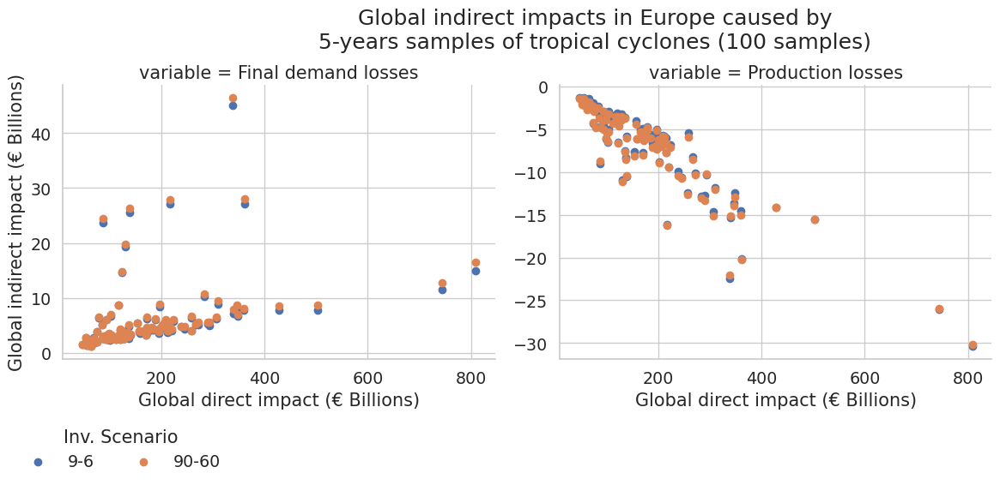

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# Sample DataFrame
df = res_df.loc[res_df.region=="Europe"].groupby(['sample', 'MRIOT', 'invtype', 'simtype', 'variable'])[['sample total direct damage', 'total indirect impact']].agg({'sample total direct damage':"first", 'total indirect impact':"sum"}).reset_index().copy()

# Replace variable values
df['variable'] = df['variable'].replace({'production_losses': 'Production losses', 'final_demand_unmet': 'Final demand losses'})
df['simtype'] = df['simtype'].replace({'aggregated': 'Yes', 'separated': 'No'})

# Replace column names
df = df.rename(columns={'sample total direct damage': 'Global direct impact (€ Billions)', 'total indirect impact': 'Global indirect impact (€ Billions)'})
df['Global direct impact (€ Billions)'] = df['Global direct impact (€ Billions)'] / 1e9  # Divide by 10^9
df['Global indirect impact (€ Billions)'] = df['Global indirect impact (€ Billions)'] / 1e3  # Divide by 10^3
df = df.rename(columns={'invtype': 'Inv. Scenario', 'simtype': 'Event interaction ?'})

df = df.loc[df["Event interaction ?"]=="Yes"]

# Set the style of the plot
sns.set(style="whitegrid",font_scale=1.25)
#sns.set_context("talk")

# Create a facet grid plot
g = sns.FacetGrid(df, col="variable", hue="Inv. Scenario", sharey=False, aspect=1.2, height=5)

# Map the scatter plot on the facet grid
g.map(plt.scatter, "Global direct impact (€ Billions)", "Global indirect impact (€ Billions)")

#g.map(sns.regplot, "Global direct impact (€ Billions)", "Global indirect impact (€ Billions)", scatter=False, lowess=True)
#g.set_titles(col_template="Inv. Scenario {col_name}", row_template="{row_name}")
# Add a legend
g.add_legend(ncol=2, bbox_to_anchor=(.21, -.05))
#sns.move_legend(g, "lower center")
g.fig.subplots_adjust(top=0.80) # adjust the Figure in rp
g.fig.suptitle('Global indirect impacts in Europe caused by\n5-years samples of tropical cyclones (100 samples)')

# Show the plot
plt.show()